In [56]:
%pylab
%matplotlib inline

Using matplotlib backend: QtAgg
%pylab is deprecated, use %matplotlib inline and import the required libraries.
Populating the interactive namespace from numpy and matplotlib


In [258]:
file_all_gal = 'voting_with_coords.csv'
file_proc_gal = 'small_bar.csv'
import pandas as pd
df_all_gal = pd.read_csv('../data/{}'.format(file_all_gal), header=None)
df_proc_gal = pd.read_csv('../data/{}'.format(file_proc_gal), header=None)

In [86]:
import numpy as np
import os
import urllib
from astropy.io import fits as pyfits

# Некоторые рассуждения про карты ошибок

Посмотрим, что вообще представляет из себя карта ошибок. 
Допустим, "сложный" фитс (сложный в смысле состоит из нескольких фитсов) уже скачан с Легаси, это invvar.fits. Было замечено, что в этом "сложном" фитсе может быть две карты разных размеров для каждой полосы (т.е всего 12 внутренних фитсов)...но, такого может и не быть (только 6 внутренних фитсов). Посмотрим на примере двух галактик:1065_21_0_line3222 (hexagons) и 1973_28_0_line12550__EON_194.556_28.948 (hexagons).

В первом случае hdulist.info() показывает, что внутри только 6 фитсов. Что это за фитсы, было уже выяснено ранее (изображение галактики и карта ошибок (в паре) для каждой полосы (g,r,z)). А вот во втором случае уже 12 внутренних фитсов. 

hexagons 1065_21_0_line3222
RA= 45.93411 DEC= -10.804386
URL= https://www.legacysurvey.org/viewer/data-for-radec/?ra=45.9344&dec=-10.8043&layer=ls-dr9&ralo=45.8816&rahi=45.9866&declo=-10.8315&dechi=-10.7772
--------------------------------------------------
Filename: ../data/images/invvarmap/hexagons/1065_21_0_line3222/invvar.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU       9   ()      
  1                1 ImageHDU        26   (256, 256)   float32   
  2                1 ImageHDU        26   (256, 256)   float32   
  3                1 ImageHDU        26   (256, 256)   float32   
  4                1 ImageHDU        26   (256, 256)   float32   
  5                1 ImageHDU        26   (256, 256)   float32   
  6                1 ImageHDU        26   (256, 256)   float32   


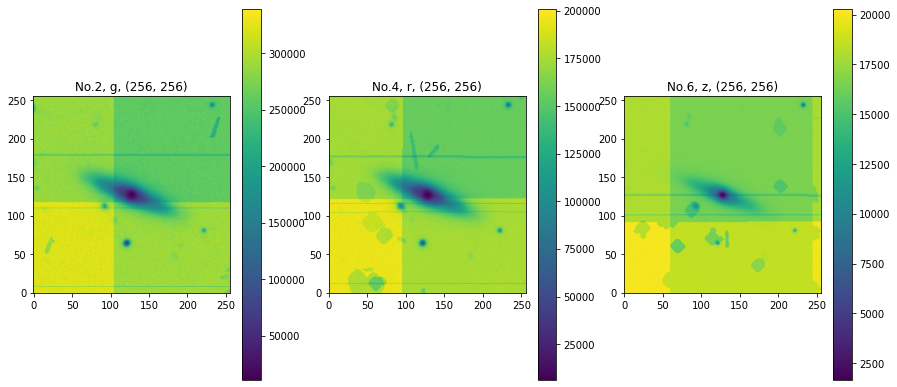

hexagons 1973_28_0_line12550__EON_194.556_28.948
RA= 194.5555 DEC= 28.94815
URL= https://www.legacysurvey.org/viewer/data-for-radec/?ra=194.5562&dec=28.9488&layer=ls-dr9&ralo=194.4505&rahi=194.6606&declo=28.8997&dechi=28.9966
--------------------------------------------------
Filename: ../data/images/invvarmap/hexagons/1973_28_0_line12550__EON_194.556_28.948/invvar.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU       9   ()      
  1                1 ImageHDU        26   (256, 256)   float32   
  2                1 ImageHDU        26   (256, 256)   float32   
  3                1 ImageHDU        26   (256, 256)   float32   
  4                1 ImageHDU        26   (256, 256)   float32   
  5                1 ImageHDU        26   (256, 256)   float32   
  6                1 ImageHDU        26   (256, 256)   float32   
  7                1 ImageHDU        26   (126, 256)   float32   
  8                1 ImageHDU        26   (126, 256)

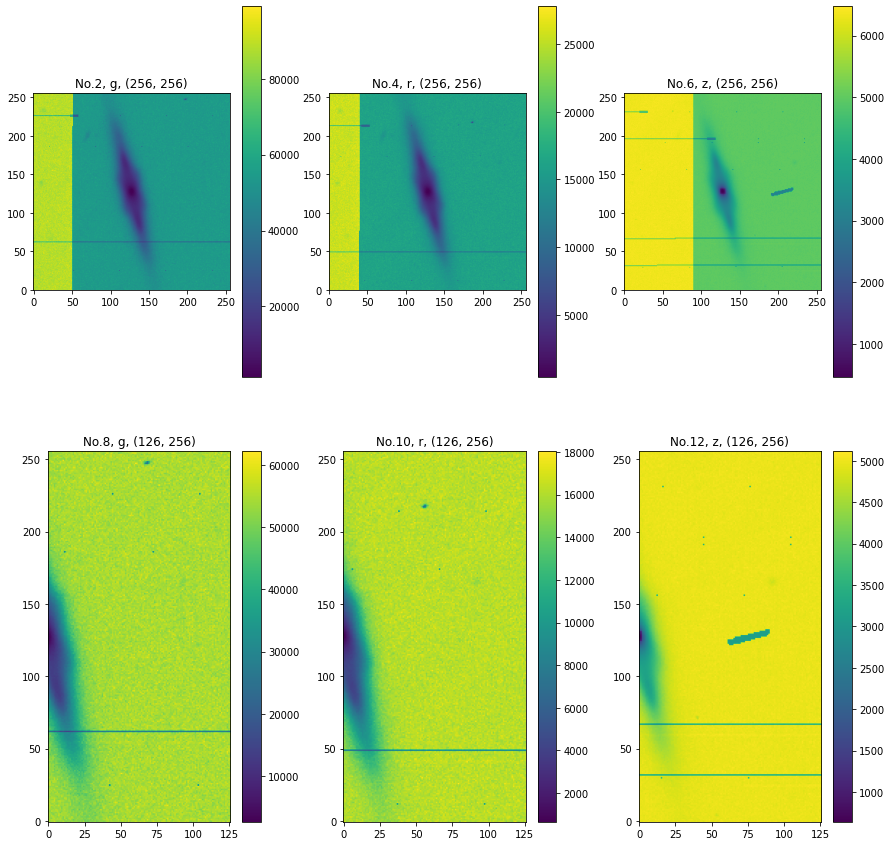

In [172]:
def view_invvarmap(name_fold,name_gal):
    pathfits = '../data/images/invvarmap/{}/{}/invvar.fits'.format(name_fold,name_gal)
    hdulist = pyfits.open(pathfits)
    hdulist.info()
    i0 = 1
    i = 2
    fig = plt.figure(figsize=[15,15])
    for band in ['g', 'r', 'z', 'g', 'r', 'z']:
        try:
            img_header = hdulist[i].header
            img_data_raw = hdulist[i].data            
            imagetyp = repr(img_header['IMAGETYP'])
            naxis1 = repr(img_header['NAXIS1'])
            naxis2 = repr(img_header['NAXIS2'])
            plt.subplot(2, 3, i0)
            plt.imshow(img_data_raw)
            plt.gca().invert_yaxis()
            plt.colorbar()
            plt.title("No.%i, %s, (%s, %s)" %(i, band, naxis1, naxis2))
            #plt.savefig(pathpng) 
            i += 2
            i0 += 1
        except IndexError:
            break
    plt.show()
print('hexagons','1065_21_0_line3222')
print('RA=', 45.93411 ,'DEC=', -10.804386)
print('URL=', 'https://www.legacysurvey.org/viewer/data-for-radec/?ra=45.9344&dec=-10.8043&layer=ls-dr9&ralo=45.8816&rahi=45.9866&declo=-10.8315&dechi=-10.7772')               
print('-'*50)
view_invvarmap('hexagons','1065_21_0_line3222')
print('hexagons','1973_28_0_line12550__EON_194.556_28.948')
print('RA=', 194.5555 ,'DEC=', 28.94815)
print('URL=', 'https://www.legacysurvey.org/viewer/data-for-radec/?ra=194.5562&dec=28.9488&layer=ls-dr9&ralo=194.4505&rahi=194.6606&declo=28.8997&dechi=28.9966')               
print('-'*50)
view_invvarmap('hexagons','1973_28_0_line12550__EON_194.556_28.948')

Итак, второй случай. Рассмотрим подробнее. Вторые карты кажутся частями первого. Но это не так. Было предположено, что галактика попадает в пересечение bricks-ов (далее будет чуть подробнее). Верно. В данном случае, в пересечении двух bricks-ов. Первые карты относятся к одному brick-у, вторые - к другому. То есть это совершенно разные карты! 

ВОПРОС: какие карты использовать в дальнейшей работе? В данном случае, наверное, лучше взять первые, где галактика полностью влезает.

P.S. Когда я прогнал галактики (поворот, обрезка), то некоторые галактики далеко смещены от центра. С углами поворота никаких проблем, только сама галактика где-то в стороне. Это, скорее, ПРОБЛЕМА, которая, возможно, требует либо ручной работы, либо сложное техническое решение. Изначальные размеры карт ошибок были выбраны 600 на 600, как и у изначальных изображений галактик. У изображений галактик при загрузке и Легаси центр кадра всегда почти в центре галактики. У карт ошибок у "проблемных" галактик  при загрузке с Легаси во-первых, центр кадра вообще не в центре галактики, во-вторых, изображение не 600 на 600, а, например, 468 на 600. Выяснил, что это связано как раз с тем, что мы видим на вторых картах, когда галактика прям на границе brick-а. Тогда при увеличении размеров кадра, центр галактики будет всё дальше от центра кадра, как будто кадру некуда расширяться, граница brick-а мешает (а мы работаем с одним brick-ом). Ну хорошо, у одного brick-а галактика на границе, но... (проверял пока у одной "проблемной" галактики) бывает такое, что и на втором brick-е галактика тоже на границе. Сложная ситуация. Есть вариант "сшить" эти два brick-а, чтоб галактика не была ни на какой границе...но, кажется, это достаточно сложный вариант. Возможно, в конечном результате будет проще подогнать галактику в центр кадра руками. Это проще, но непонятно, насколько безвредно. Возможно, эта проблема будет понятнее после просмотра результатов и дальнейшего текста. Или ещё чуть понятнее будет, если посмотреть на два след. изображения галактики 1804_16_0_line10378__EON_170.647_20.704 : 

https://portal.nersc.gov/cfs/cosmo/data/legacysurvey/dr9/south/coadd/170/1705p207/legacysurvey-1705p207-image.jpg

https://portal.nersc.gov/cfs/cosmo/data/legacysurvey/dr9/south/coadd/170/1707p207/legacysurvey-1707p207-image.jpg

Следующий момент. На первых картах есть резкий скачок интенсивности. Про это подробнее дальше.

Кстати говоря, посмотрим, к каким bricks-ам относятся первые и вторые карты. Посмотрим на headers (а именно, на дескриптор BRICK).

In [181]:
def view_invvarmap2(name_fold,name_gal,index):
    print('  No.%i, %s, %s' %(index,name_fold,name_gal))
    pathfits = '../data/images/invvarmap/{}/{}/invvar.fits'.format(name_fold,name_gal)
    hdulist = pyfits.open(pathfits)
    img_header = hdulist[index].header
    #img_data_raw = hdulist[6].data
    print(repr(img_header))
    print('-'*50)
view_invvarmap2('hexagons','1973_28_0_line12550__EON_194.556_28.948',6)
view_invvarmap2('hexagons','1973_28_0_line12550__EON_194.556_28.948',8)

  No.6, hexagons, 1973_28_0_line12550__EON_194.556_28.948
XTENSION= 'IMAGE   '           / IMAGE extension                                
BITPIX  =                  -32 / number of bits per data pixel                  
NAXIS   =                    2 / number of data axes                            
NAXIS1  =                  256 / length of data axis 1                          
NAXIS2  =                  256 / length of data axis 2                          
PCOUNT  =                    0 / required keyword; must = 0                     
GCOUNT  =                    1 / required keyword; must = 1                     
SURVEY  = 'DECaLS  '                                                            
VERSION = 'DR9-south'                                                           
IMAGETYP= 'invvar  '           / None                                           
BRICK   = '1946p290'                                                            
BRICK_X0=                 3300                     

Действительно, разные bricks-ы. Они пересекаются, как уже могли видеть. Посмотрим на сами эти bricks-ы (изображения):

https://portal.nersc.gov/cfs/cosmo/data/legacysurvey/dr9/south/coadd/194/1946p290/legacysurvey-1946p290-image.jpg
https://portal.nersc.gov/cfs/cosmo/data/legacysurvey/dr9/south/coadd/194/1944p290/legacysurvey-1944p290-image.jpg

В первом случае наша галактика снизу справа, во втором: слева снизу, прям на границе. Это можно найти здесь (для случая 1946p290): (а дальше нажать на JPEG image)

https://www.legacysurvey.org/viewer/data-for-radec/?ra=194.5562&dec=28.9488&layer=ls-dr9&ralo=194.4505&rahi=194.6606&declo=28.8997&dechi=28.9966

Чуть поинтереснее будет, если нажмём на Coadded images, попадём сюда:

https://portal.nersc.gov/cfs/cosmo/data/legacysurvey/dr9/south/coadd/194/1946p290/

А теперь поработаем. Скачаем legacysurvey-1946p290-invvar-z.fits.fz и legacysurvey-1944p290-invvar-z.fits.fz (для определённости выбрали полосу z) и нарисуем.

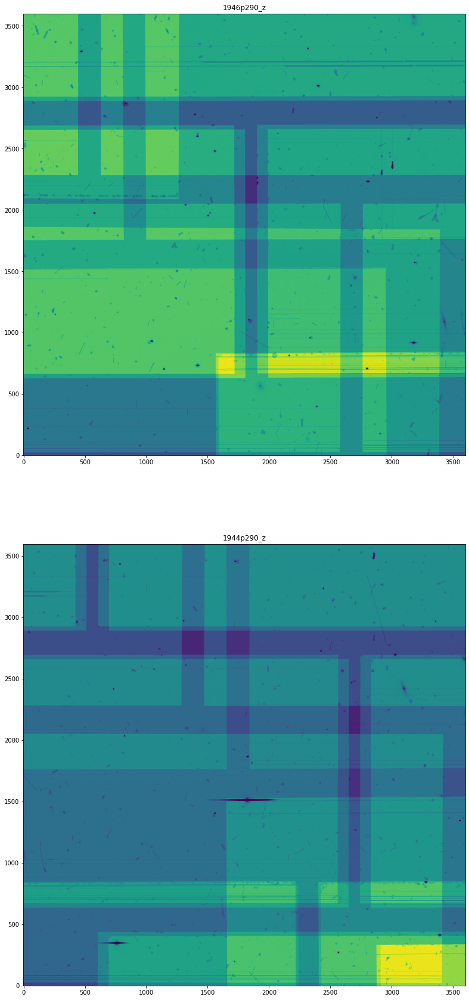

In [193]:
output_invvarmap_1946p290_z='../data/images/invvarmap/hexagons/1973_28_0_line12550__EON_194.556_28.948/invvarmap1946p290_z.fits'
output_invvarmap_1944p290_z='../data/images/invvarmap/hexagons/1973_28_0_line12550__EON_194.556_28.948/invvarmap1944p290_z.fits'
#url_1946p290_z = "https://portal.nersc.gov/cfs/cosmo/data/legacysurvey/dr9/south/coadd/194/1946p290/legacysurvey-1946p290-invvar-z.fits.fz"
#url_1944p290_z = "https://portal.nersc.gov/cfs/cosmo/data/legacysurvey/dr9/south/coadd/194/1944p290/legacysurvey-1944p290-invvar-z.fits.fz"
#urllib.request.urlretrieve(url_1946p290_z,output_invvarmap_1946p290_z)
#urllib.request.urlretrieve(url_1944p290_z,output_invvarmap_1944p290_z)
pathpng1946 = '../data/images/invvarmap/hexagons/1973_28_0_line12550__EON_194.556_28.948/invvarmap1946p290_z.png'
pathpng1944 = '../data/images/invvarmap/hexagons/1973_28_0_line12550__EON_194.556_28.948/invvarmap1944p290_z.png'
hdulist1946 = pyfits.open(output_invvarmap_1946p290_z)
hdulist1944 = pyfits.open(output_invvarmap_1944p290_z)
img_data_raw1946 = hdulist1946[1].data
img_data_raw1944 = hdulist1944[1].data
fig = plt.figure(figsize=[30,30])
plt.subplot(211)
plt.imshow(img_data_raw1946)
plt.gca().invert_yaxis()
#plt.colorbar()
plt.title("1946p290_z")
plt.savefig(pathpng1946, dpi=300)
plt.subplot(212)
plt.imshow(img_data_raw1944)
plt.gca().invert_yaxis()
#plt.colorbar()
plt.title("1944p290_z")
plt.savefig(pathpng1944, dpi=300)
plt.show()

А теперь важно. На первой картинке наша галактика примерно по координатам (3400,1100), на второй картинке - примерно (0,1100). Итак, эти две картинки - два bricks-а, о которых уже сказано выше. Они, в свою очередь, состоят из наложенных друг на друга...грубо скажем, "пластин". Здесь: https://www.legacysurvey.org/viewer/data-for-radec/?ra=194.5562&dec=28.9488&layer=ls-dr9&ralo=194.4505&rahi=194.6606&declo=28.8997&dechi=28.9966 -- есть как бы два раздела - CCDs overlapping brick и CCDs overlapping RA,Dec. Если посмотреть на эти два рисунка выше, то можно сказать, что наша галактика лежит в пересечении трёх "пластин". Действительно, в разделе CCDs overlapping RA,Dec есть три "пластины": decam 637635 N25 z, decam 521413 N26 z, decam 718751 N26 z. Здесь важно понять, что эти "пластины" на первом brick-е продолжаются на втором. А в разделе CCDs overlapping brick перечислены "пластины", которые в принципе видны на этих двух bricks-ах. Причём, там много тех "пластин", которые не содержат нашу галактику. Возвращаясь к первым картам, где было указано на резкий скачок интенсивности, могу сказать, что именно такая "пластина" из CCDs overlapping brick слева и накладывается, она не дотягивается до нашей галактики, но находится в её окружении. Итак,
ВОПРОСЫ: 
1) Как я понимаю, с этими "пластинами", которые содержат галактику (три "пластины") и не содержат, но находятся в её окружении, нужно что-то делать. Могу предположить, что можно всё это усреднить, чтобы не было никаких резких скачков интенсивностей. 

2) Скорее, технический, но, наверное, сложный вопрос. Если три "пластины" из CCDs overlapping RA,Dec, допустим, несложно определить (их всего-то там в полосе z три штуки, типа ясно, что брать), то как быть с "пластинами" в окружении? Причём всё это хочется сделать автоматически, чтоб не возиться с каждой галактикой. Отсюда и сложность, как определять "пластину" в окружении галактики. 

Видимо, все эти проблемы с подводными камнями нужно решить до поворота с обрезкой.

# Поворот и обрезка карт ошибок

Изображение галактики у нас есть изначально. Однако... я не сохранил в начале практики параметры, необходимые для поворота и обрезки. Поэтому я беру исходное изображение галактики в z и определяю параметры описанного эллипса (угол, оси). Поскольку у нас уже есть повёрнутые и обрезанные изображение галактик, то эти же параметры будут применены к картам ошибок. Функции наследуются из самого первого ноутбука, где загружались, поворачивались, обрезались исходные изображения галактик, с некоторыми изменениями.

In [195]:
from photutils.segmentation import make_2dgaussian_kernel, detect_sources, deblend_sources, SourceFinder, SourceCatalog
from photutils.background import Background2D, MedianBackground
from astropy.convolution import convolve
from scipy.ndimage import rotate

In [257]:
# Загрузка карты ошибок с размером 600 на 600 
def load_legacy_invvarmap(name_fold=None,name=None, ra=None, dec=None):
    if not os.path.isdir('../data/images/invvarmap/{}'.format(name_fold)):
        os.makedirs('../data/images/invvarmap/{}'.format(name_fold))
    if not os.path.isdir('../data/images/invvarmap/{}/{}'.format(name_fold,name)):
        os.makedirs('../data/images/invvarmap/{}/{}'.format(name_fold,name))
    output_image='../data/images/invvarmap/{}/{}/invvar.fits'.format(name_fold,name)
    
    try:
        url = ("http://legacysurvey.org/viewer/cutout.fits?ra={}&dec={}&layer=ls-dr9-north&subimage&size=600").format(ra, dec)
        urllib.request.urlretrieve(url,output_image)
    except Exception:
        url = ("http://legacysurvey.org/viewer/cutout.fits?ra={}&dec={}&layer=ls-dr9-south&subimage&size=600").format(ra, dec)
        urllib.request.urlretrieve(url,output_image)

# Получаем индекс галактики в voting_with_coords.csv, чтоб по индексу можно было получить ra,dec 
def getind_gal(name_gal,df):
    for i in arange(1,df.shape[0]):
        if name_gal == df[0][i]:
            return i 
            break 

# Получаем параметры описывающего галактику эллипса, чтобы потом повернуть карты ошибок на нужный угол и обрезать
def getparams_ell(name_fold,name_gal,segdeb_npix,segdeb_nlev,segdeb_contr):    
    pathimag_z='../data/images/{}/{}/raw_z.fits'.format(name_fold,name_gal)
    pathparams='../data/images/{}/{}/raw_z_params.dat'.format(name_fold,name_gal)
    #pathpng = '../data/images/{}/{}/png/raw/{}_segments.png'.format(name_fold,name_gal,name_gal)
    
    hdulist = pyfits.open(pathimag_z)
    img_header = hdulist[0].header
    img_data_raw = hdulist[0].data
    
    bkg_estimator = MedianBackground()
    bkg = Background2D(img_data_raw, (50, 50), filter_size=(3, 3),
                   bkg_estimator=bkg_estimator)
    img_data_raw -= bkg.background  # subtract the background
    
    threshold = 1.5 * bkg.background_rms
    
    kernel = make_2dgaussian_kernel(3.0, size=5)  # FWHM = 3.
    convolved_data = convolve(img_data_raw, kernel)
    segment_map = detect_sources(convolved_data, threshold, npixels=10)
    
    segm_deblend = deblend_sources(convolved_data, segment_map,
                               npixels=segdeb_npix, nlevels=segdeb_nlev, contrast=segdeb_contr,
                               progress_bar=False)
    
    cat = SourceCatalog(img_data_raw, segm_deblend, convolved_data=convolved_data)
    tab = cat.to_table()

    ColLab = tab['label']
    MaxColLab = ColLab[-1]
    ColArea = tab['area']
    ColArea0 = ColArea.copy() 
    ColArea.sort()
    MaxArea = ColArea[-1]
    for i in arange(MaxColLab):
        if ColArea0[i] == MaxArea:
            MaxAreaIndex = i+1
    
    catsub = cat.get_label(MaxAreaIndex)
    tabsub = catsub.to_table()
   
    return tabsub

# Получаем новые размеры кадра
def getnew_cropsize(input_tab,sizefac,xfac,yfac):
    area = input_tab['area'].value
    ecc = input_tab['eccentricity'].value
    xcentroid = input_tab['xcentroid'].value
    ycentroid = input_tab['ycentroid'].value
    simimaj = np.sqrt(area/(np.pi*np.sqrt(1.0-ecc**2)))
    simimin = simimaj*np.sqrt(1.0-ecc**2) 
    
    newsize = 2.0*simimaj*sizefac
    xcropsize = simimaj*xfac
    ycropsize = simimin*yfac
    
    return [newsize,xcropsize,ycropsize,xcentroid,ycentroid]

# Поворот и обрезка кадра
def rotate_crop_image(name_fold,name_gal,angle,size,xlen,ylen,xcentroid,ycentroid):
    i = 2
    for band in ['g', 'r', 'z']:
        pathfits = '../data/images/invvarmap/{}/{}/invvar.fits'.format(name_fold,name_gal,band)
        pathrotcropfits='../data/images/invvarmap/{}/{}/invvar_{}_rotcrop.fits'.format(name_fold,name_gal,band)
        pathpng = '../data/images/invvarmap/{}/{}/invvar_{}_rotcrop.png'.format(name_fold,name_gal,band)
        hdulist = pyfits.open(pathfits)
        img_header = hdulist[i].header
        img_data_raw = hdulist[i].data
        
        rot_im = rotate(img_data_raw, angle=angle[0], reshape=False)
            
        xcen = size / 2.0
        ycen = size / 2.0
        xcenrot = (xcentroid - xcen) * np.cos(angle[0]) - (ycentroid - ycen) * np.sin(angle[0]) + xcen
        ycenrot = (xcentroid - xcen) * np.sin(angle[0]) + (ycentroid - ycen) * np.cos(angle[0]) + ycen
            
        ymin = max(0, int(ycenrot-ylen))
        ymax = min(size, int(ycenrot+ylen))
        xmin = max(0, int(xcenrot-xlen))
        xmax = min(size, int(xcenrot+xlen))
        rot_im = rot_im[ymin:ymax, xmin:xmax] 
            
        hdu = pyfits.PrimaryHDU(data=rot_im) 
        hdu.writeto(pathrotcropfits,overwrite=True)
            
        #fig = plt.figure(figsize=[11,6])
        #ax = plt.gca()
        #plt.subplot(111)
        #plt.imshow(rot_im)
        #plt.savefig(pathpng)
        i += 2

# Рисуем результат. Всего 6 картинок: 3 исходных изображения в grz и 3 карты ошибок в grz. В скобках в названии
# каждой картинки указаны размеры
def draw_images_invvarmap_rotcrop(name_fold,name_gal):
    print('=*'*50)
    print("%s" %name_fold)
    print("%s" %name_gal)
    i=1
    fig = plt.figure(figsize=[16,9])
    for band in ['g', 'r', 'z']:
        pathimage='../data/images/{}/{}/raw_{}_rotcrop.fits'.format(name_fold,name_gal,band)
        pathivm_rotcrop='../data/images/invvarmap/{}/{}/invvar_{}_rotcrop.fits'.format(name_fold,name_gal,band)
        pathpng='../data/images/invvarmap/{}/{}/ima_inv_rotcrop.png'.format(name_fold,name_gal,band)
        hdulist_ima = pyfits.open(pathimage)
        hdulist_inv = pyfits.open(pathivm_rotcrop)
        img_header_ima = hdulist_ima[0].header
        img_header_inv = hdulist_inv[0].header
        img_data_raw_ima = hdulist_ima[0].data
        img_data_raw_inv = hdulist_inv[0].data 
        naxis1_ima = repr(img_header_ima['NAXIS1'])
        naxis1_inv = repr(img_header_inv['NAXIS1'])
        naxis2_ima = repr(img_header_ima['NAXIS2'])
        naxis2_inv = repr(img_header_inv['NAXIS2'])
        plt.subplot(2, 3, i)
        plt.imshow(img_data_raw_ima, vmin=0, vmax=1.2)
        plt.gca().invert_yaxis()
        plt.gca().grid()
        xcen_ima = float(naxis1_ima) / 2.0
        ycen_ima = float(naxis2_ima) / 2.0
        plt.axvline(x=xcen_ima,color='r', alpha=0.3)
        plt.axhline(y=ycen_ima,color='r', alpha=0.3)
        #plt.colorbar()
        plt.title("image, %s, (%s, %s)" %(band, naxis1_ima, naxis2_ima))
        plt.subplot(2, 3, i+3)
        plt.imshow(img_data_raw_inv)
        plt.gca().invert_yaxis()
        plt.gca().grid()
        xcen_inv = float(naxis1_inv) / 2.0
        ycen_inv = float(naxis2_inv) / 2.0
        plt.axvline(x=xcen_inv,color='r', alpha=0.3)
        plt.axhline(y=ycen_inv,color='r', alpha=0.3)
        #plt.colorbar()
        plt.title("invvar, %s, (%s, %s)" %(band, naxis1_inv, naxis2_inv))
        i += 1
    plt.savefig(pathpng,dpi=300)
    plt.show()

=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*
small_bar
1712_89_0_line7739__EON_140.351_19.567


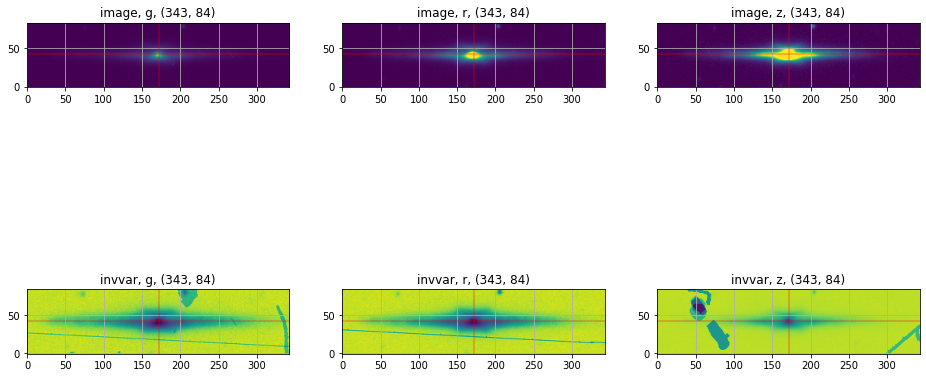

=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*
small_bar
1457_18_0_line11264__EON_180.421_4.770


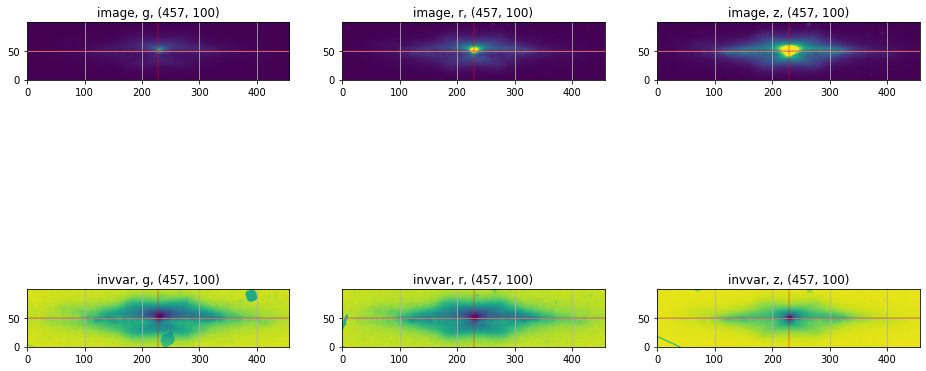

=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*
small_bar
1973_28_0_line12550__EON_194.556_28.948


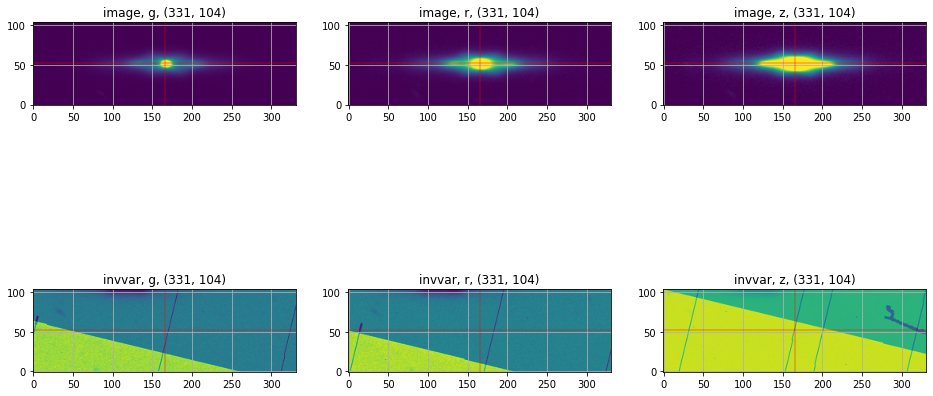

=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*
small_bar
1804_16_0_line10378__EON_170.647_20.704


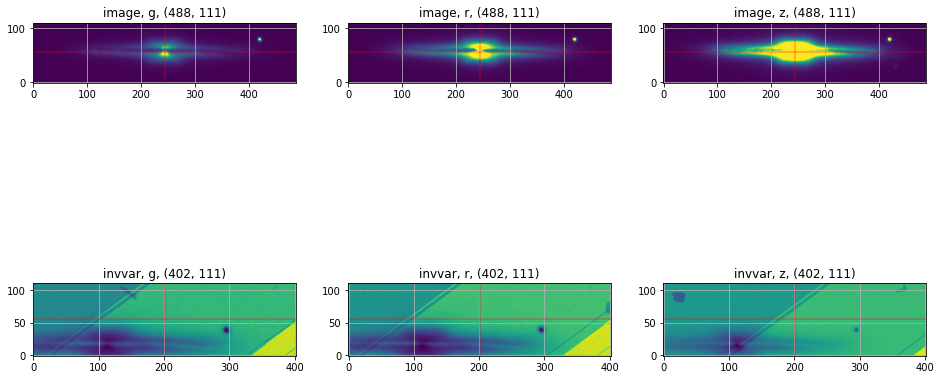

=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*
small_bar
1371_94_0_line12718__EON_196.196_3.905


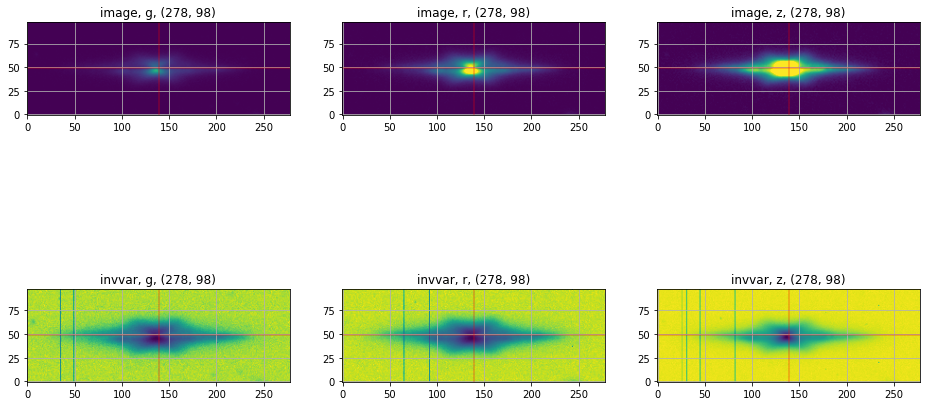

=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*
small_bar
1422_76_0_line2819__EON_39.676_6.909


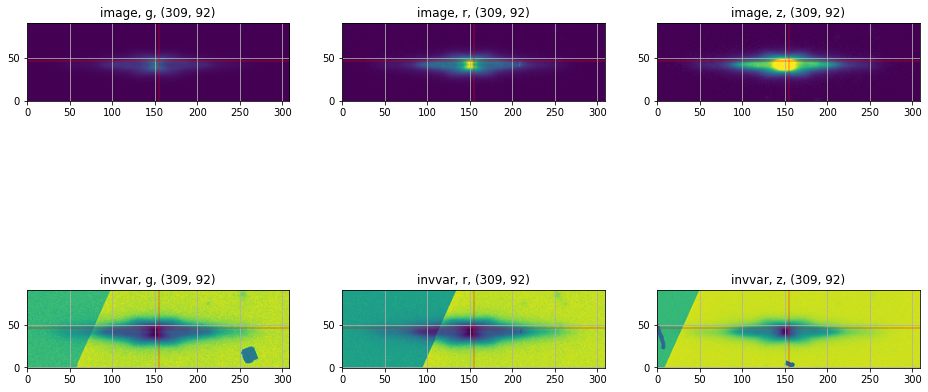

=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*
small_bar
2130_52_0_line15235__EON_226.162_38.011


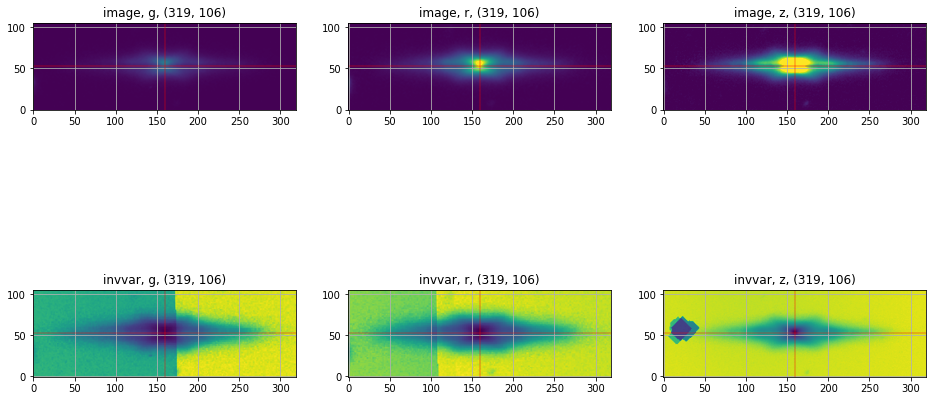

=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*
small_bar
2005_4_0_line21447__EON_342.032_28.295


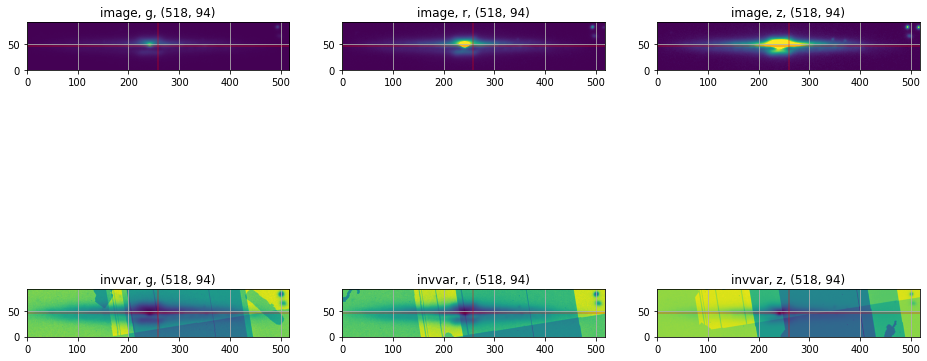

In [261]:
name_fold = file_proc_gal.replace('.csv',"")
size=600
angles = []; sizes = []; xlencrops = []; ylencrops = []; xcentroids = []; ycentroids = []
i = 0
for name_gal in df_proc_gal[0]:  
    ind_gal = getind_gal(name_gal,df_all_gal)
    load_legacy_invvarmap(name_fold=name_fold,name=name_gal,ra=df_all_gal[1][ind_gal],
                    dec=df_all_gal[2][ind_gal])
    tab_params = getparams_ell(name_fold,name_gal,segdeb_npix=200,segdeb_nlev=32,segdeb_contr=0.001)
    newsize,xlencrop,ylencrop,xcentroid,ycentroid = getnew_cropsize(tab_params,sizefac=2.0,xfac=1.25,yfac=2.0)
    angles.append(tab_params['orientation'].value)
    sizes.append(newsize)
    xlencrops.append(xlencrop)
    ylencrops.append(ylencrop)
    xcentroids.append(xcentroid)
    ycentroids.append(ycentroid)
    rotate_crop_image(name_fold,name_gal,angles[i],size,xlencrops[i],ylencrops[i],xcentroids[i],ycentroids[i])
    draw_images_invvarmap_rotcrop(name_fold,name_gal)
    i += 1    


#ind_gal = getind_gal('1401_46_0_line19910',df_all_gal)
#load_legacy_invvarmap(name_fold='hexagons',name='1401_46_0_line19910', ra=df_all_gal[1][ind_gal], dec=df_all_gal[2][ind_gal])
#angles = []; sizes = []; xlencrops = []; ylencrops = []; xcentroids = []; ycentroids = []
#tab_params = getparams_ell('hexagons','1401_46_0_line19910',segdeb_npix=200,segdeb_nlev=32,segdeb_contr=0.001)
#newsize,xlencrop,ylencrop,xcentroid,ycentroid = getnew_cropsize(tab_params,sizefac=2.0,xfac=1.25,yfac=2.0)
#angles.append(tab_params['orientation'].value)
#sizes.append(newsize)
#xlencrops.append(xlencrop)
#ylencrops.append(ylencrop)
#xcentroids.append(xcentroid)
#ycentroids.append(ycentroid)
#rotate_crop_image('hexagons','1401_46_0_line19910',angles[0],size,xlencrops[0],ylencrops[0],xcentroids[0],ycentroids[0])
#draw_images_invvarmap_rotcrop('hexagons','1401_46_0_line19910')

=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*
mass_bulge
1237_70_0_line1682__EON_21.900_-1.105


/tmp/ipykernel_8780/3032192363.py:148: UserWarning: Attempting to set identical bottom == top == -0.5 results in singular transformations; automatically expanding.
  plt.imshow(img_data_raw_inv)


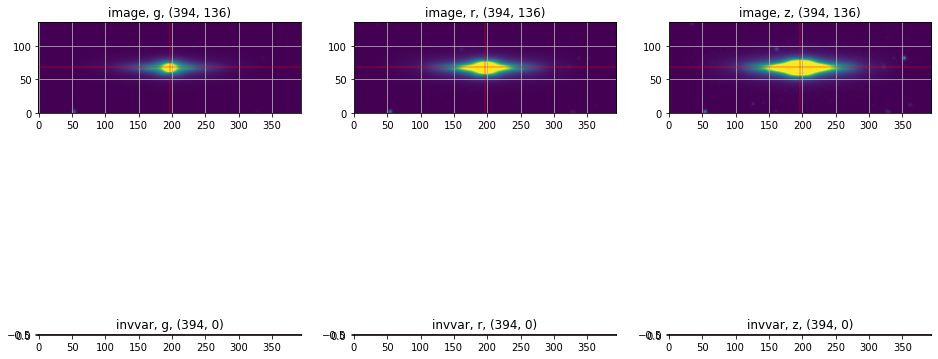

=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*
mass_bulge
1422_76_0_line2819__EON_39.676_6.909


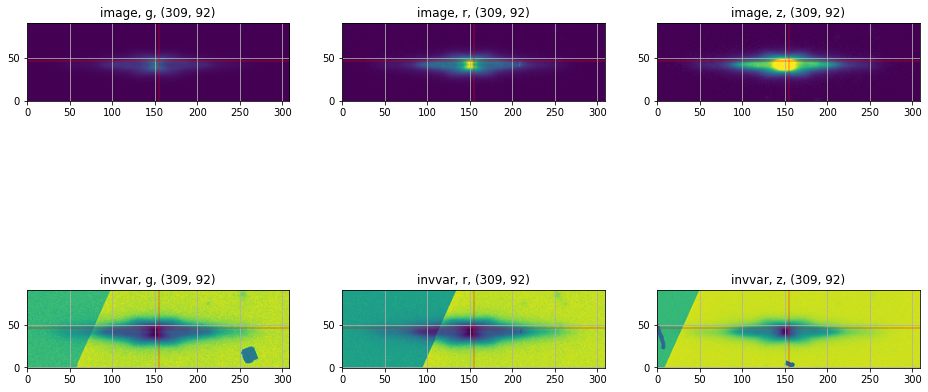

=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*
mass_bulge
1881_7_0_line7993__EON_143.943_24.379


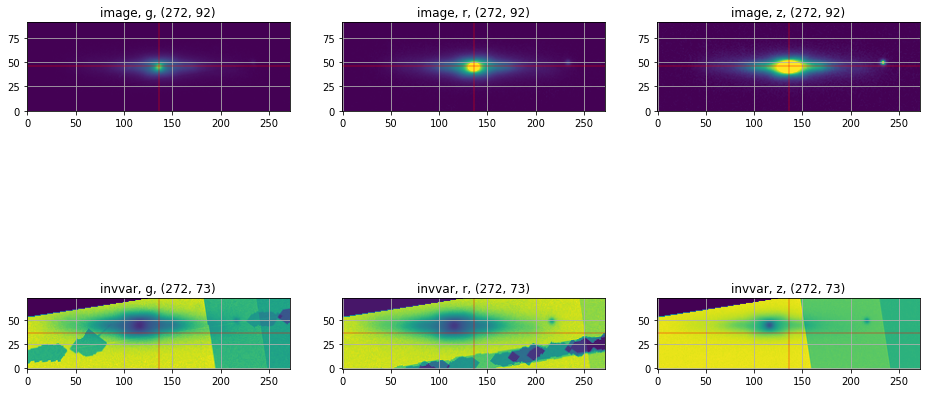

=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*
mass_bulge
1804_16_0_line10378__EON_170.647_20.704


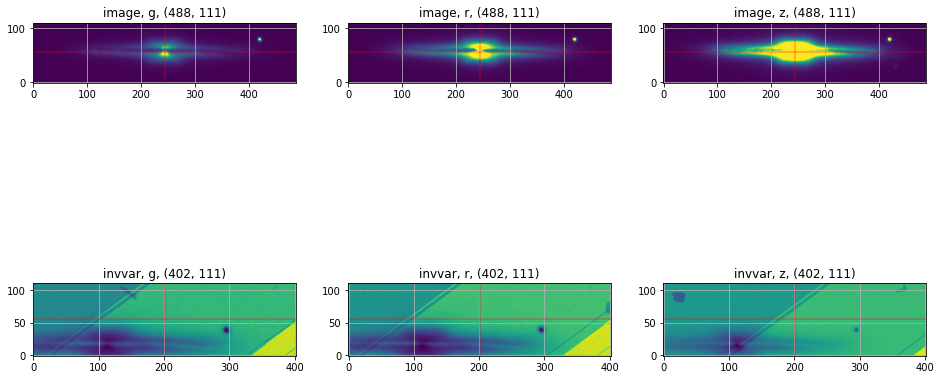

=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*
mass_bulge
1371_94_0_line12718__EON_196.196_3.905


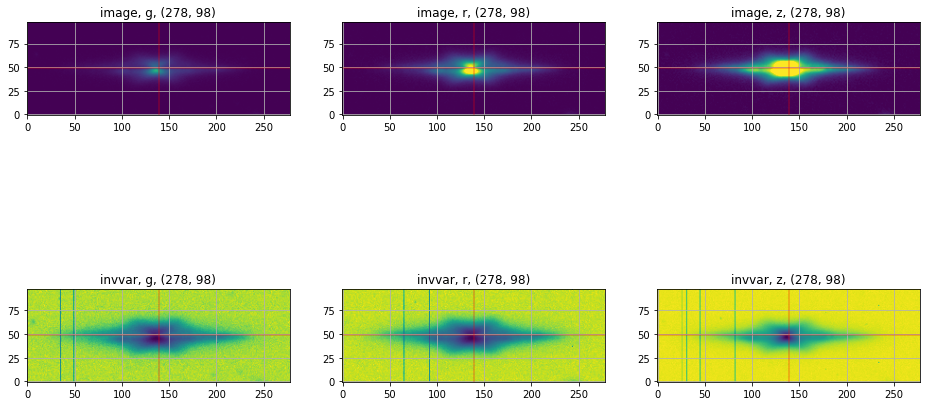

=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*
mass_bulge
1973_28_0_line12550__EON_194.556_28.948


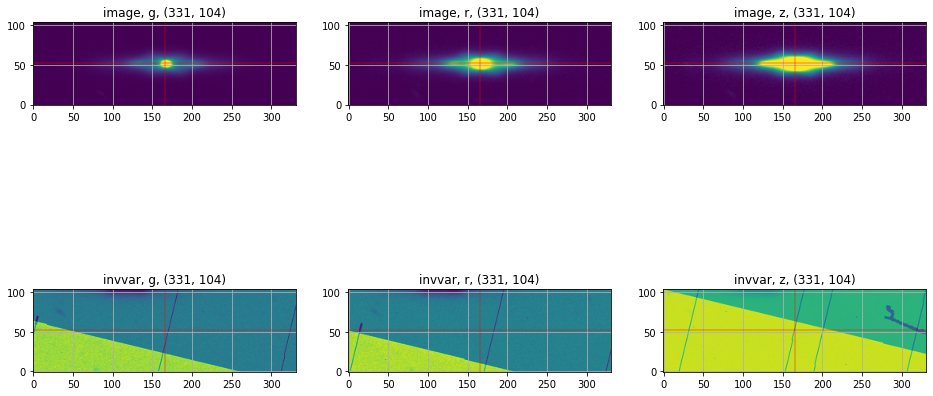

=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*
mass_bulge
1896_39_0_line13795__EON_208.851_25.292


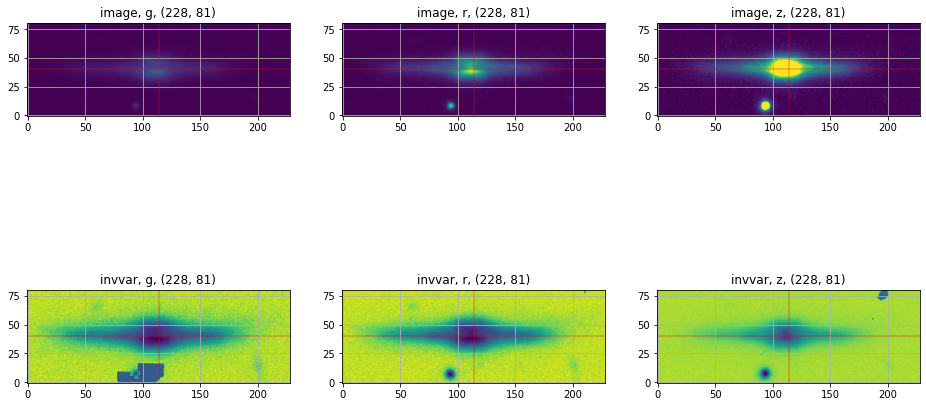

=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*
mass_bulge
2130_52_0_line15235__EON_226.162_38.011


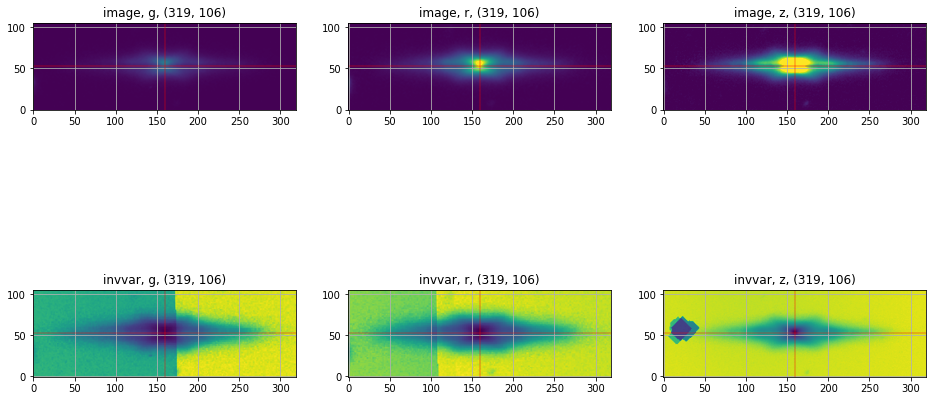

=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*
mass_bulge
1469_90_0_line15668__EON_232.554_7.767


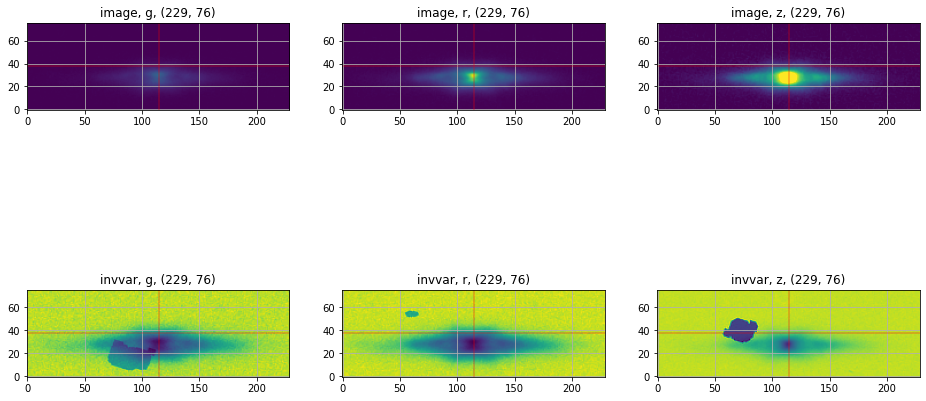

=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*
mass_bulge
1845_57_0_line21705__EON_345.959_22.314


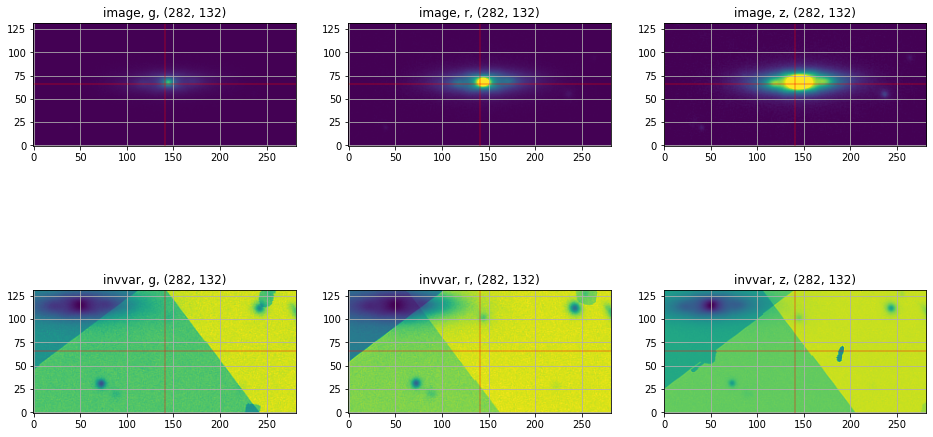

=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*
mass_bulge
1676_76_0_line22071__EON_351.297_15.200


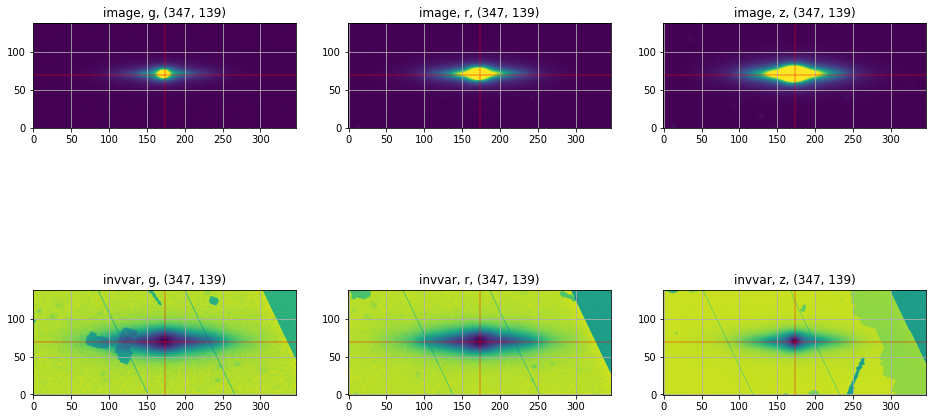

=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*
mass_bulge
803_97_0_line2129


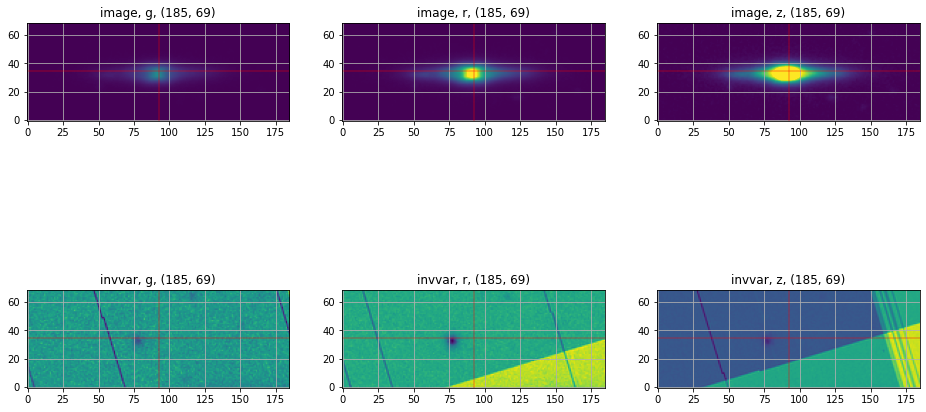

=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*
mass_bulge
1150_29_0_line1953


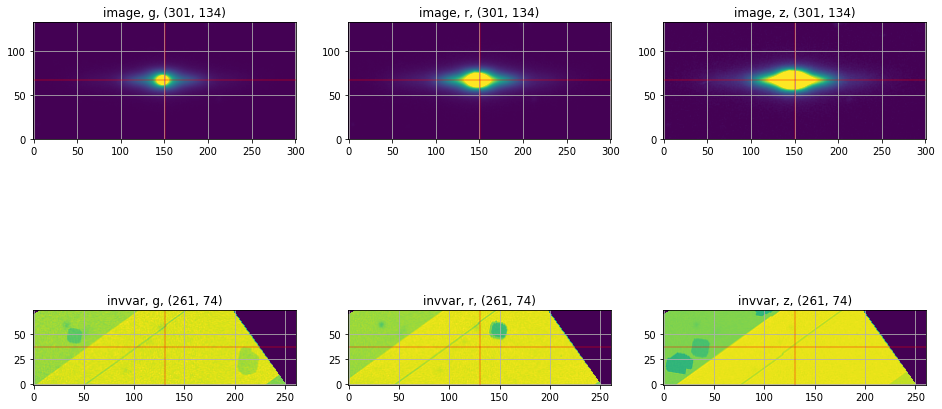

=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*
mass_bulge
1937_45_0_line2281


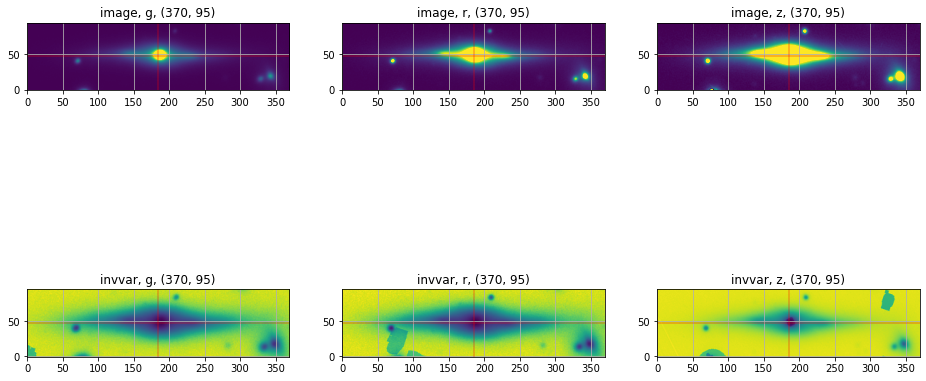

=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*
mass_bulge
804_63_1_line2514


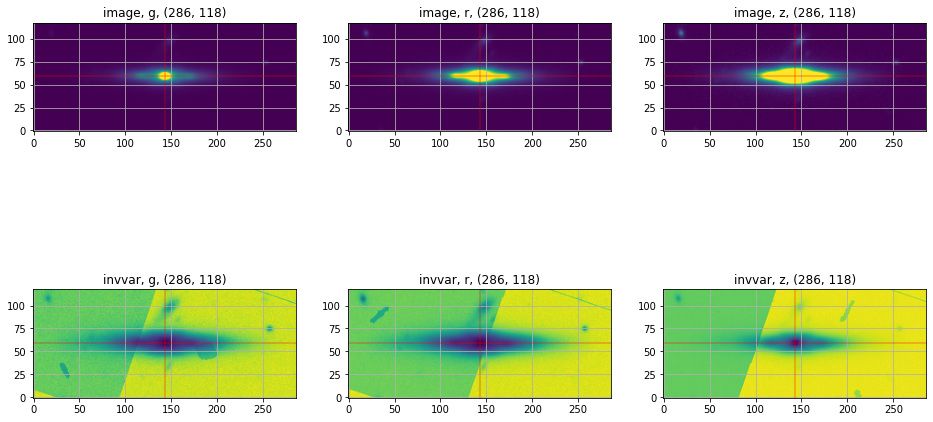

=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*
mass_bulge
724_45_0_line3075


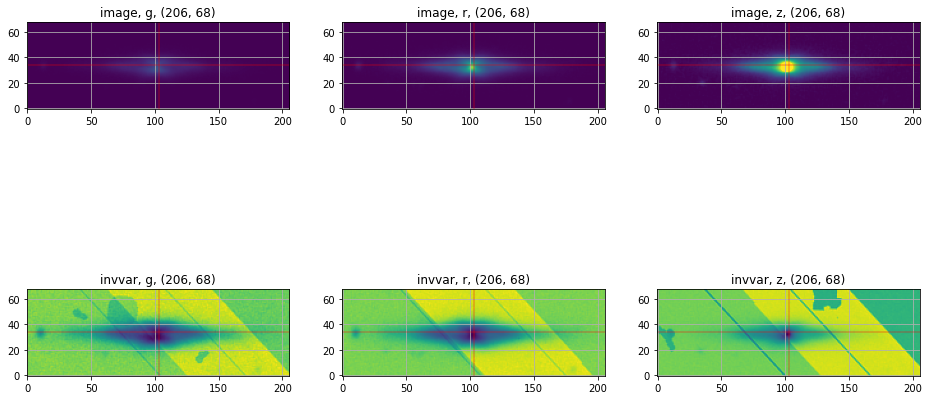

=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*
mass_bulge
1156_73_0_line3628


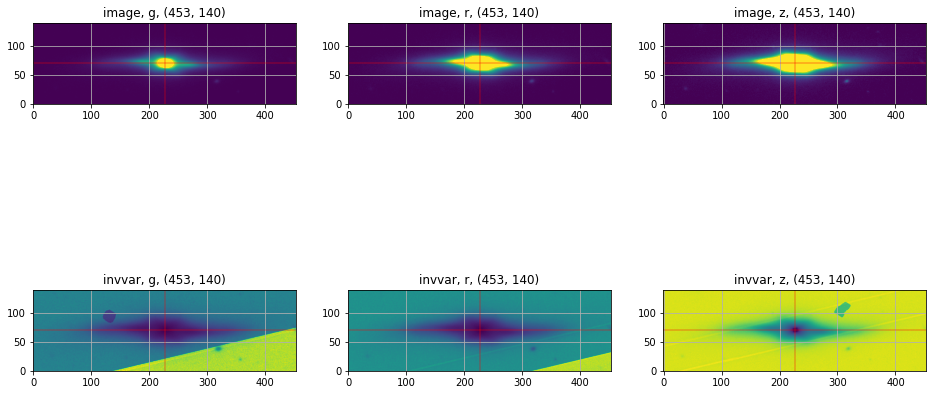

=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*
mass_bulge
1248_24_0_line4035


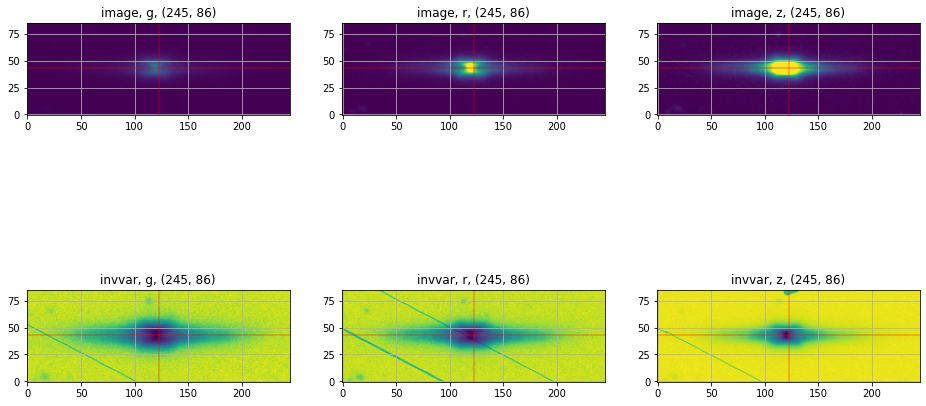

=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*
mass_bulge
1071_6_0_line4184


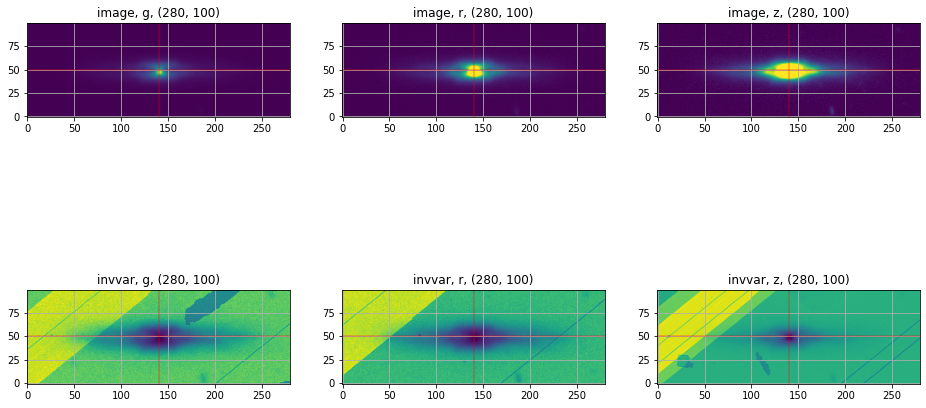

=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*
mass_bulge
732_62_0_line4681


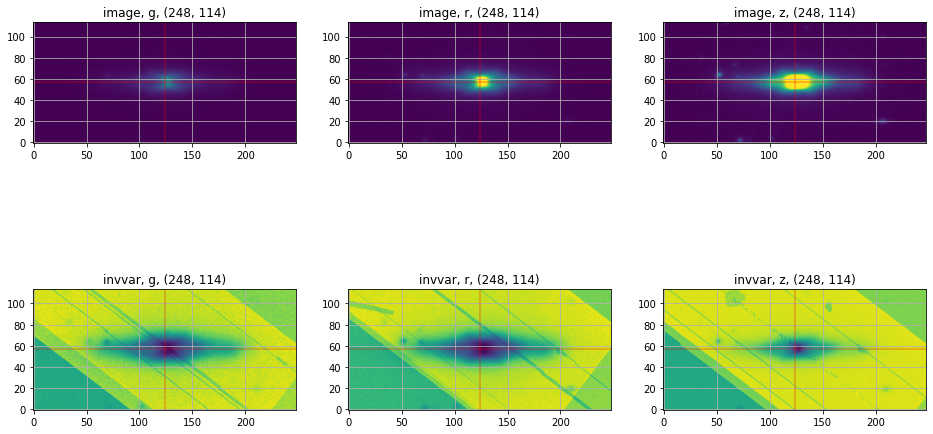

=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*
mass_bulge
1707_6_0_line6339


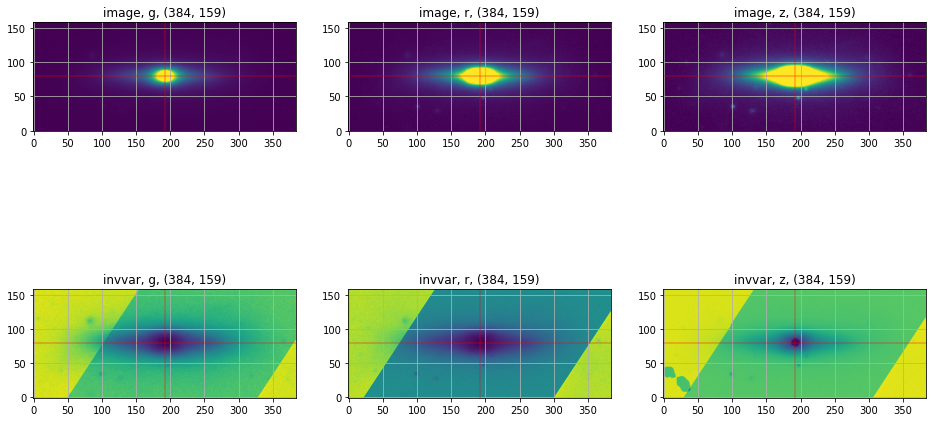

=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*
mass_bulge
1354_49_0_line6745


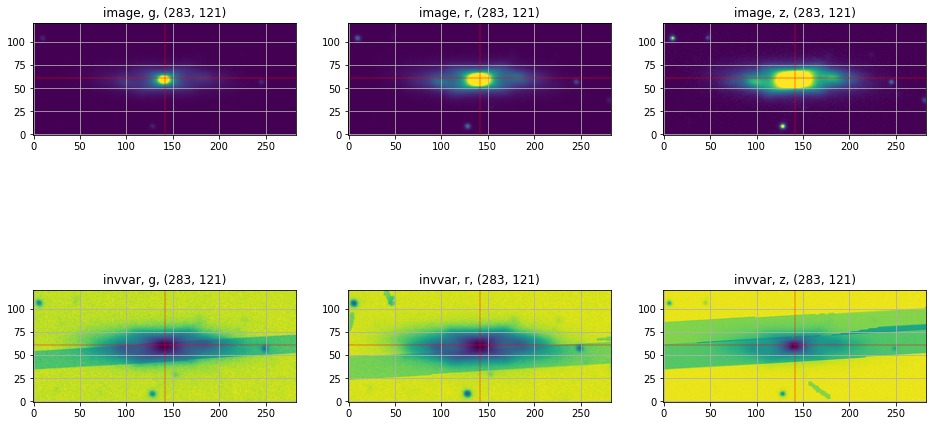

=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*
mass_bulge
1181_30_0_line8916


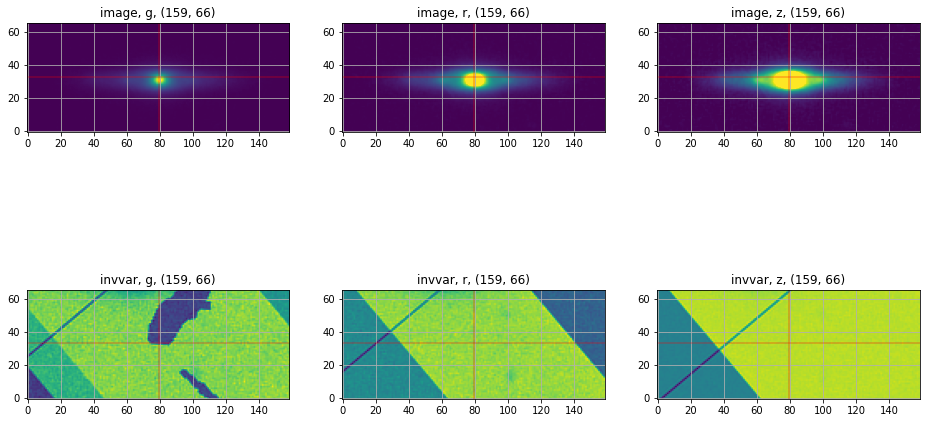

=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*
mass_bulge
1095_54_0_line9913


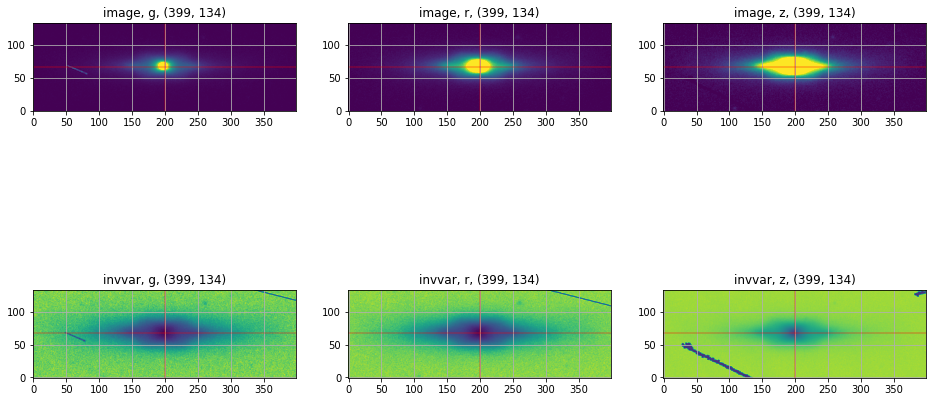

IndexError: list index out of range

In [263]:
file_proc_gal = 'mass_bulge.csv'
df_proc_gal = pd.read_csv('../data/{}'.format(file_proc_gal), header=None)
name_fold = file_proc_gal.replace('.csv',"")
size=600
angles = []; sizes = []; xlencrops = []; ylencrops = []; xcentroids = []; ycentroids = []
i = 0
for name_gal in df_proc_gal[0]:  
    ind_gal = getind_gal(name_gal,df_all_gal)
    load_legacy_invvarmap(name_fold=name_fold,name=name_gal,ra=df_all_gal[1][ind_gal],
                    dec=df_all_gal[2][ind_gal])
    tab_params = getparams_ell(name_fold,name_gal,segdeb_npix=200,segdeb_nlev=32,segdeb_contr=0.001)
    newsize,xlencrop,ylencrop,xcentroid,ycentroid = getnew_cropsize(tab_params,sizefac=2.0,xfac=1.25,yfac=2.0)
    angles.append(tab_params['orientation'].value)
    sizes.append(newsize)
    xlencrops.append(xlencrop)
    ylencrops.append(ylencrop)
    xcentroids.append(xcentroid)
    ycentroids.append(ycentroid)
    rotate_crop_image(name_fold,name_gal,angles[i],size,xlencrops[i],ylencrops[i],xcentroids[i],ycentroids[i])
    draw_images_invvarmap_rotcrop(name_fold,name_gal)
    i += 1

=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*
iso_break
966_80_1_line118


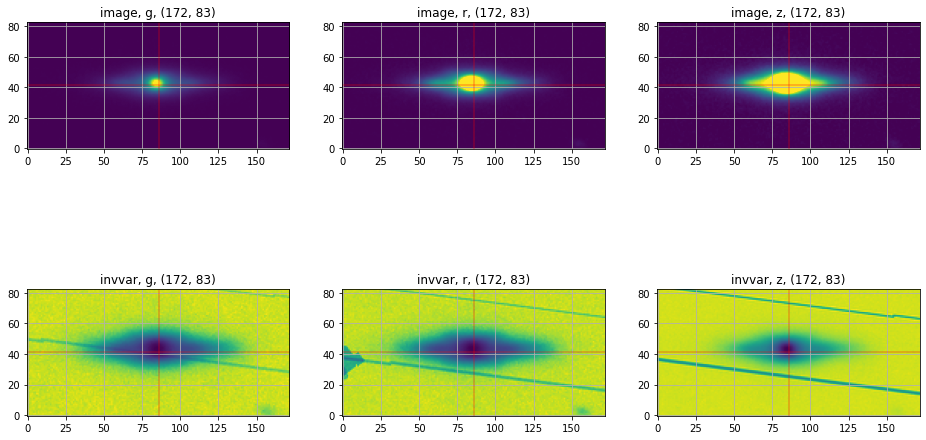

=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*
iso_break
1043_82_1_line19939


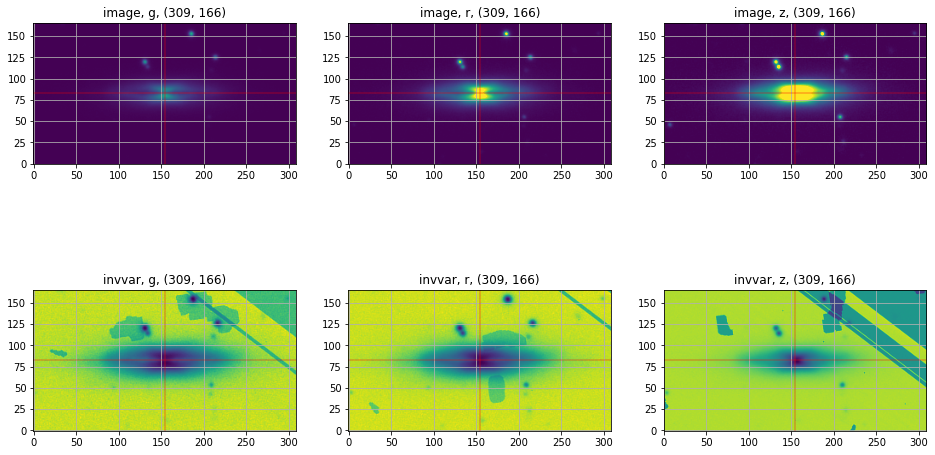

=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*
iso_break
1422_76_0_line2819__EON_39.676_6.909


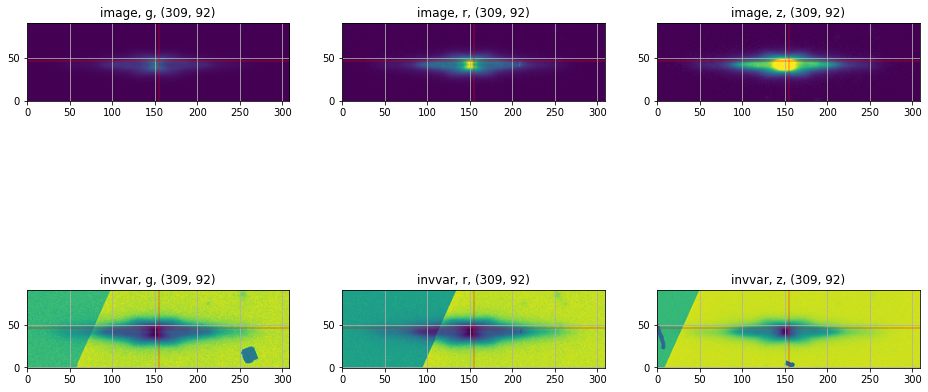

=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*
iso_break
1466_34_0_line14620


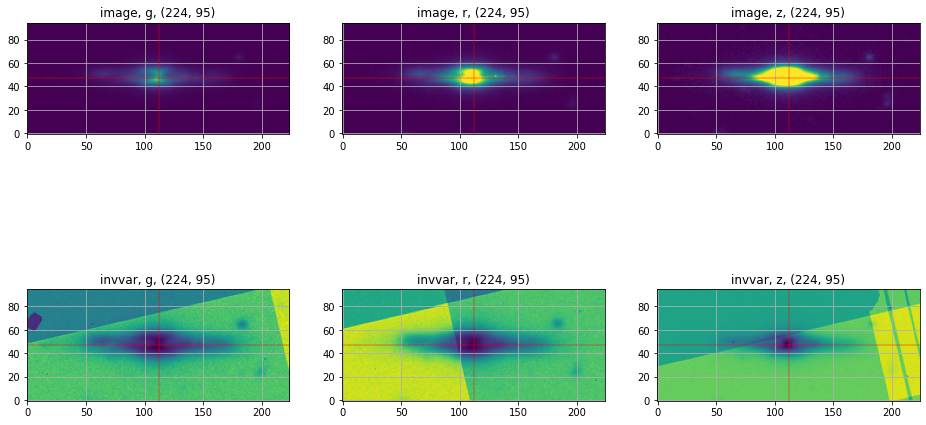

=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*
iso_break
1589_24_0_line22427


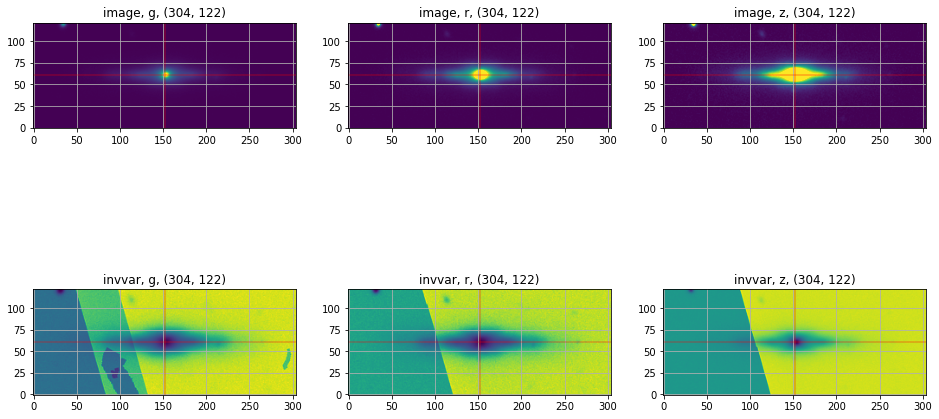

=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*
iso_break
1594_63_0_line1297


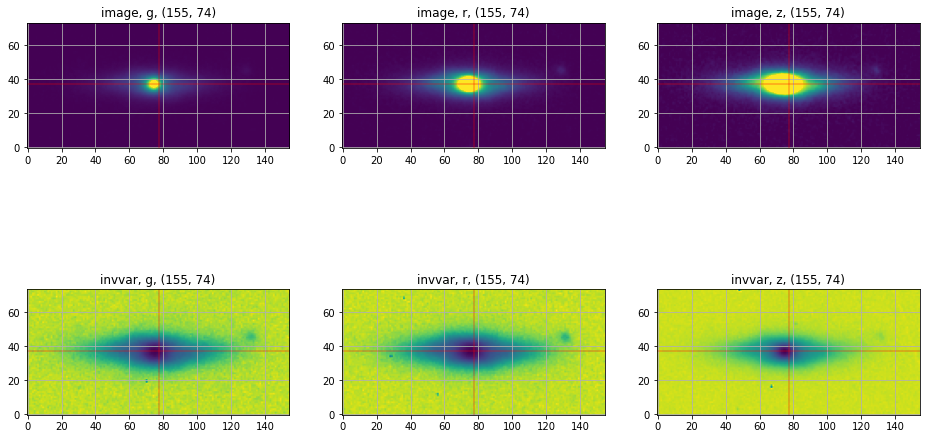

=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*
iso_break
1674_60_0_line21679__EON_345.549_14.475


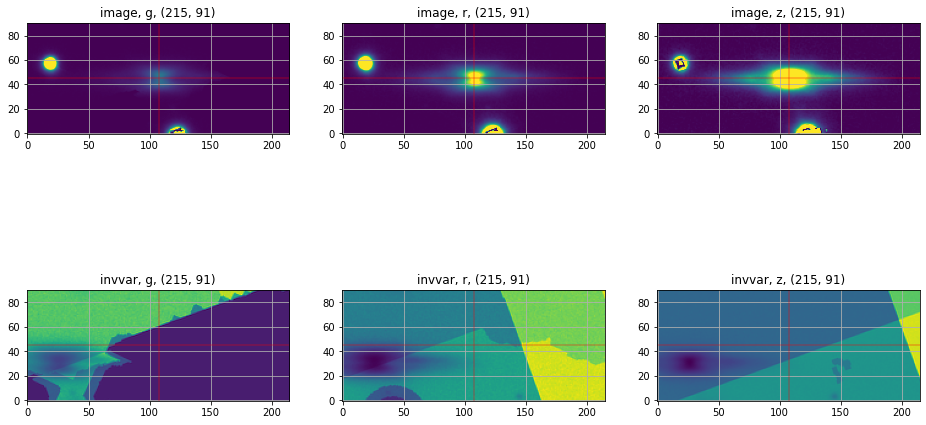

=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*
iso_break
1723_60_0_line12146__EON_190.304_18.604


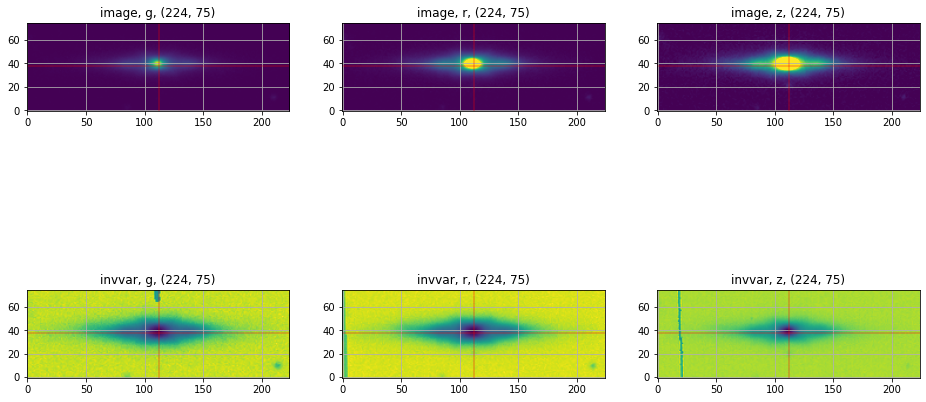

=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*
iso_break
1850_50_0_line850


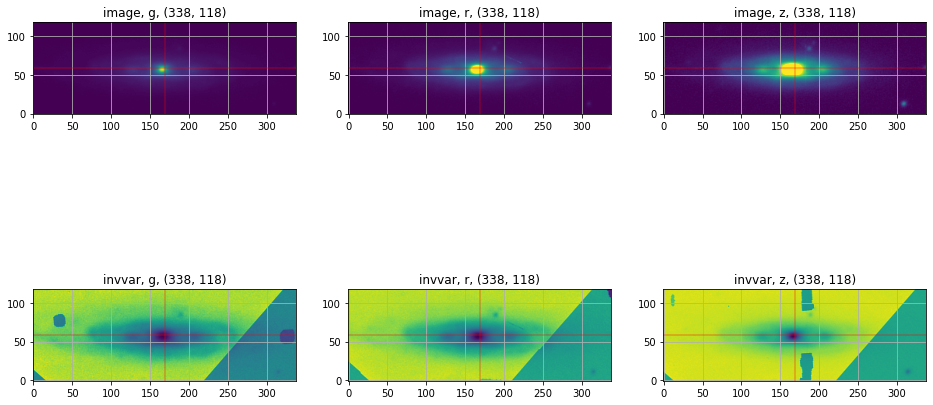

=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*
iso_break
1902_66_0_line15931__EON_236.371_26.603


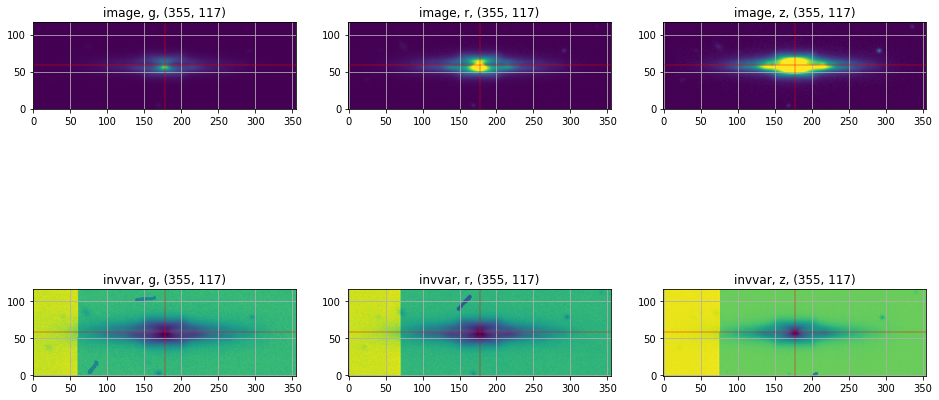

=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*
iso_break
1910_23_1_line18487


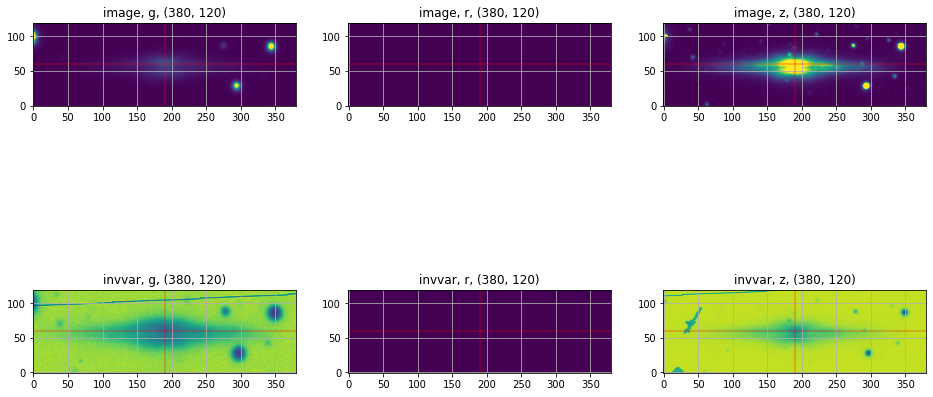

=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*
iso_break
1929_68_0_line22271


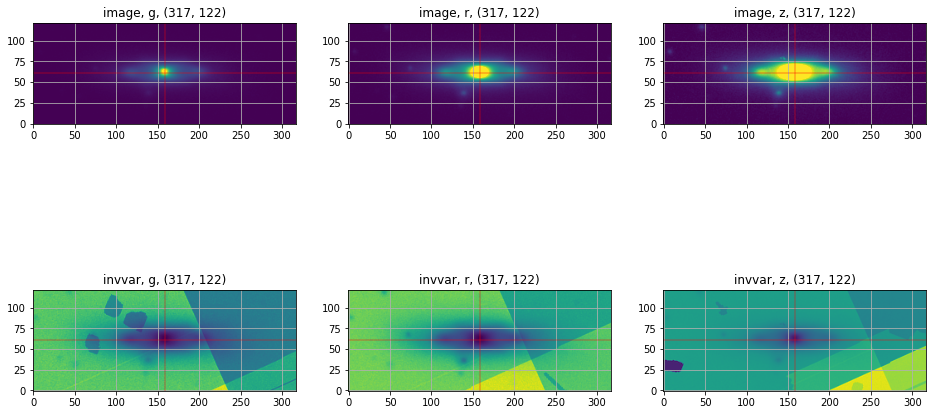

=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*
iso_break
2015_16_1_line2021


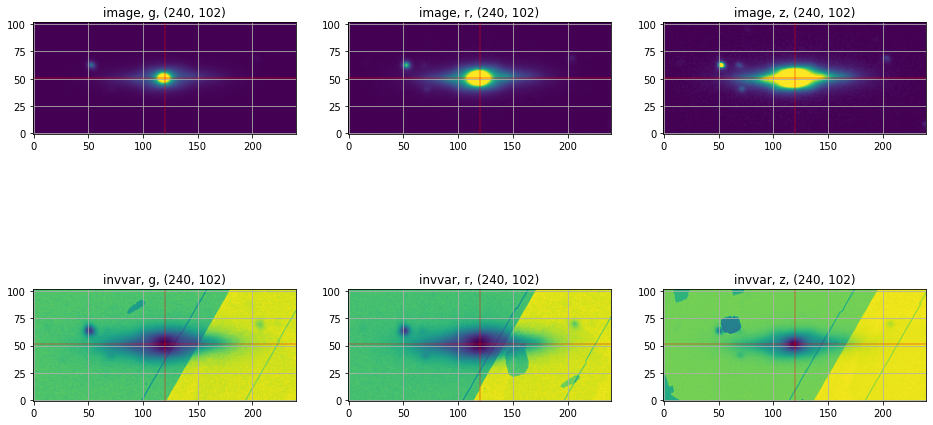

=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*
iso_break
2322_38_0_line12701


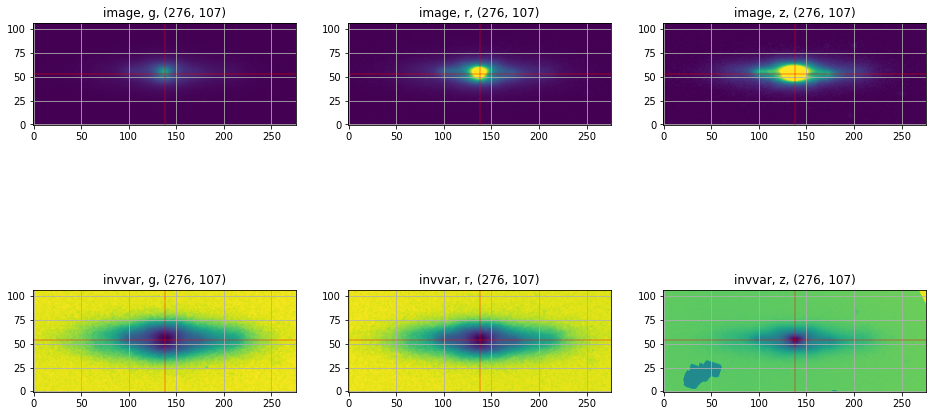

=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*
iso_break
2488_52_1_line18561


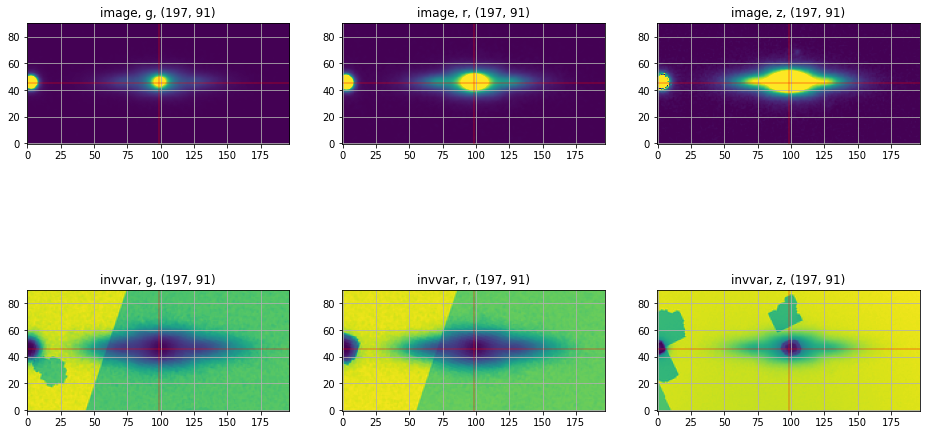

=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*
iso_break
1720_93_1_line10922


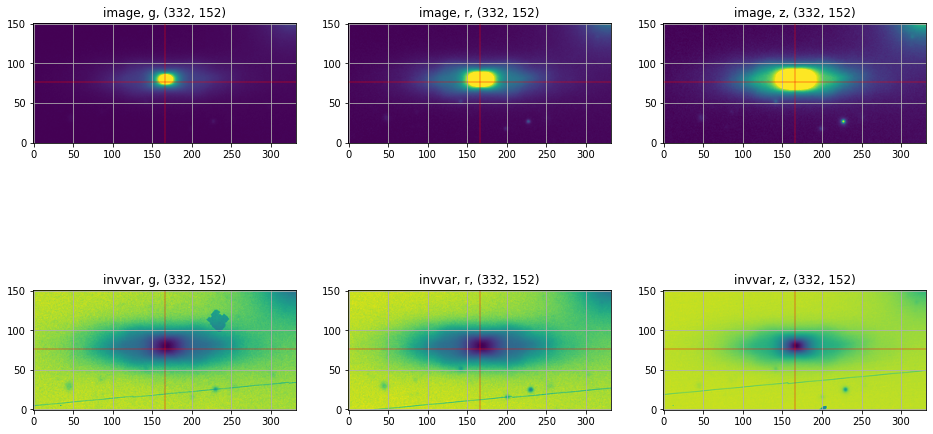

=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*
iso_break
732_72_0_line4676


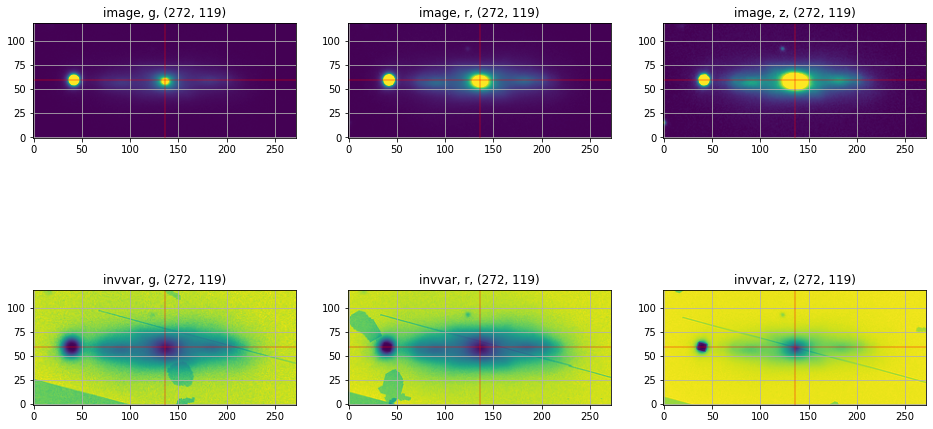

In [264]:
file_proc_gal = 'iso_break.csv'
df_proc_gal = pd.read_csv('../data/{}'.format(file_proc_gal), header=None)
name_fold = file_proc_gal.replace('.csv',"")
size=600
angles = []; sizes = []; xlencrops = []; ylencrops = []; xcentroids = []; ycentroids = []
i = 0
for name_gal in df_proc_gal[0]:  
    ind_gal = getind_gal(name_gal,df_all_gal)
    load_legacy_invvarmap(name_fold=name_fold,name=name_gal,ra=df_all_gal[1][ind_gal],
                    dec=df_all_gal[2][ind_gal])
    tab_params = getparams_ell(name_fold,name_gal,segdeb_npix=200,segdeb_nlev=32,segdeb_contr=0.001)
    newsize,xlencrop,ylencrop,xcentroid,ycentroid = getnew_cropsize(tab_params,sizefac=2.0,xfac=1.25,yfac=2.0)
    angles.append(tab_params['orientation'].value)
    sizes.append(newsize)
    xlencrops.append(xlencrop)
    ylencrops.append(ylencrop)
    xcentroids.append(xcentroid)
    ycentroids.append(ycentroid)
    rotate_crop_image(name_fold,name_gal,angles[i],size,xlencrops[i],ylencrops[i],xcentroids[i],ycentroids[i])
    draw_images_invvarmap_rotcrop(name_fold,name_gal)
    i += 1

=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*
hexagons
1237_50_0_line1676__EON_21.856_-1.913


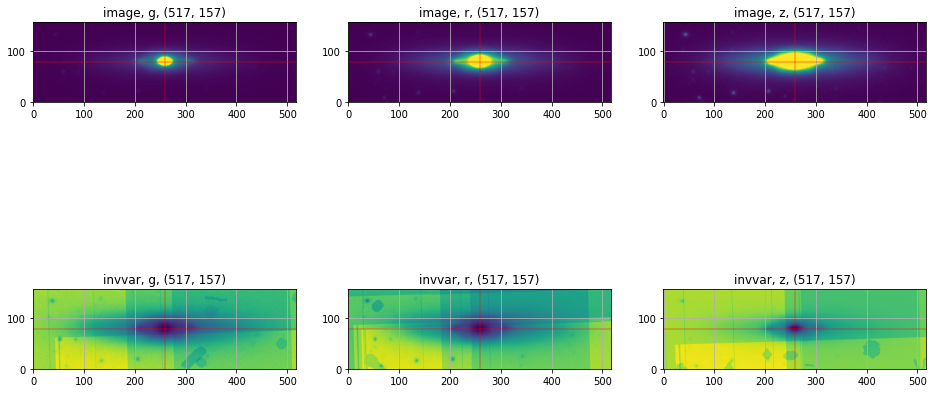

=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*
hexagons
1973_28_0_line12550__EON_194.556_28.948


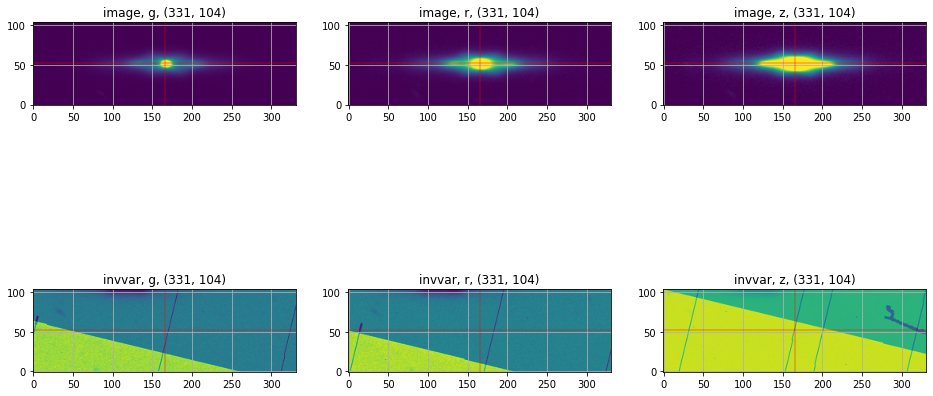

=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*
hexagons
1401_46_0_line19910


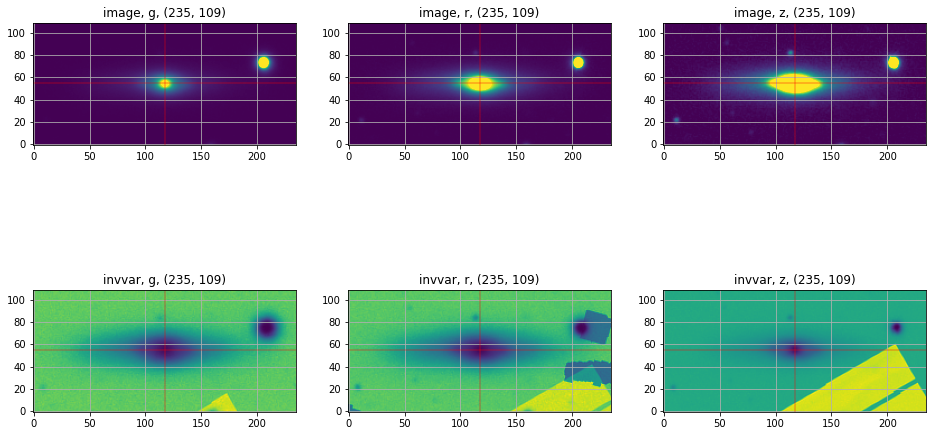

=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*
hexagons
EON_18.239_-0.345


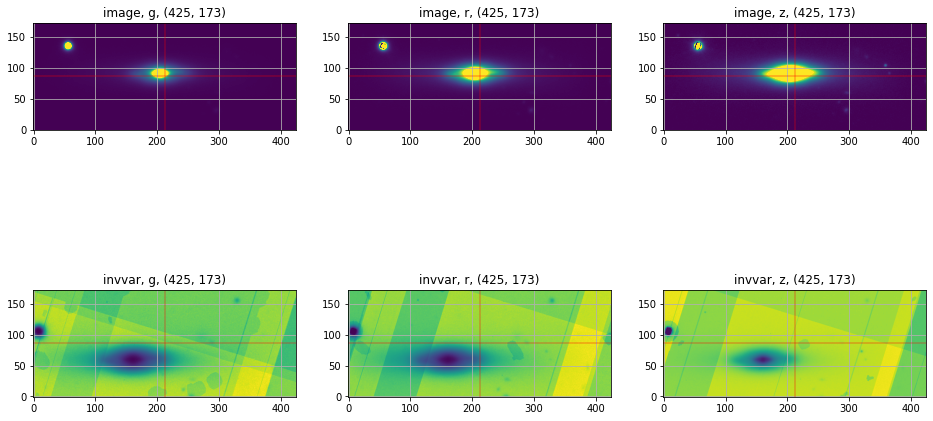

=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*
hexagons
EON_124.743_57.803


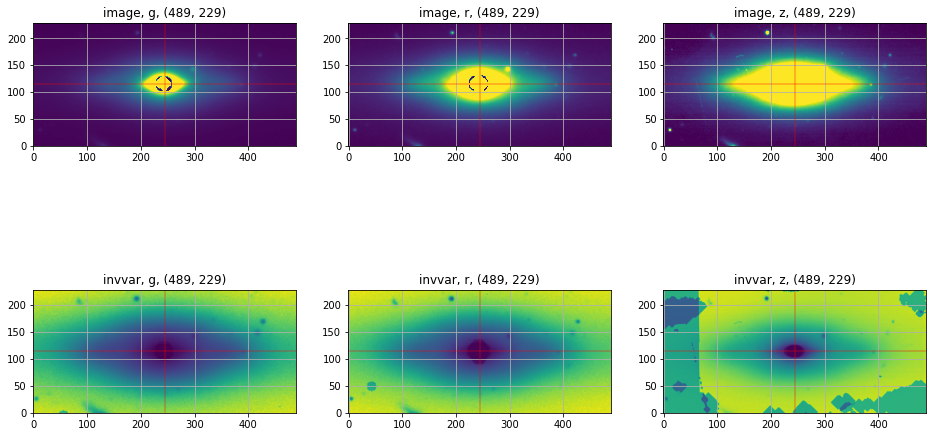

=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*
hexagons
EON_137.160_32.593


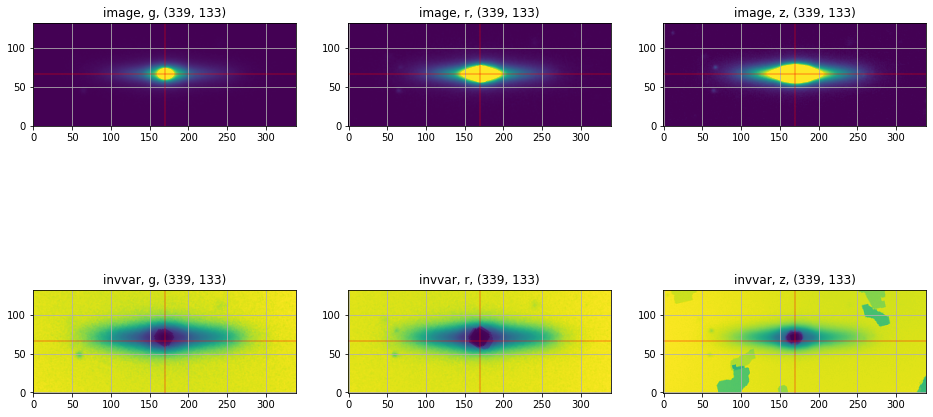

=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*
hexagons
EON_150.398_-2.994


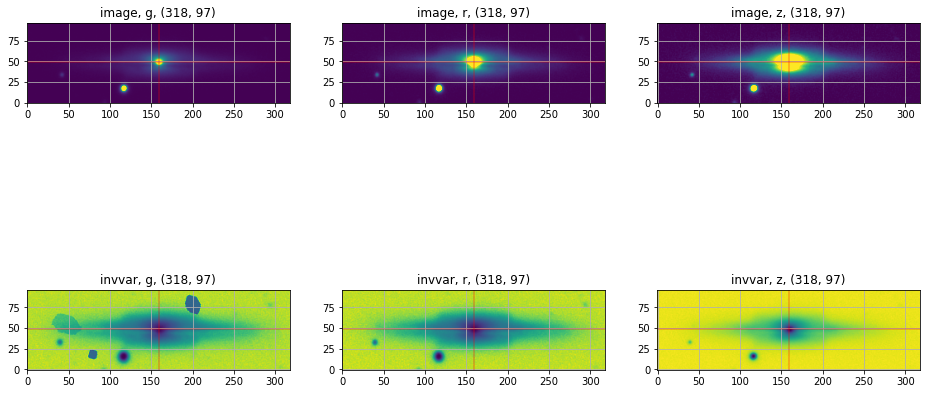

=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*
hexagons
EON_210.175_55.164


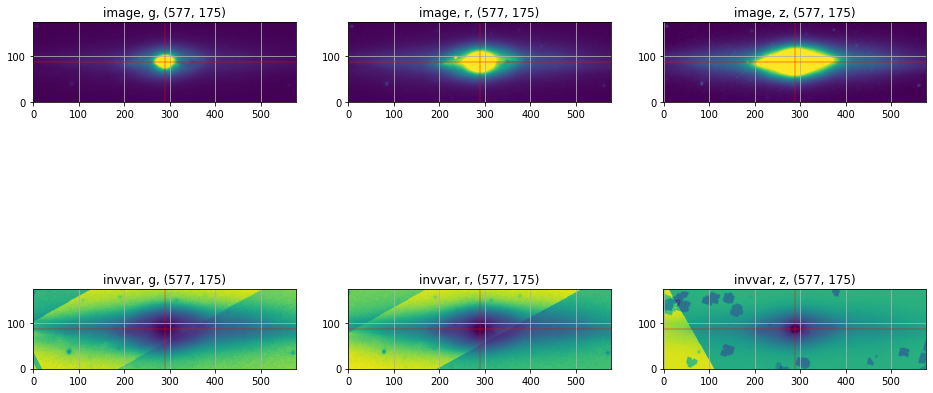

=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*
hexagons
EON_206.090_55.856


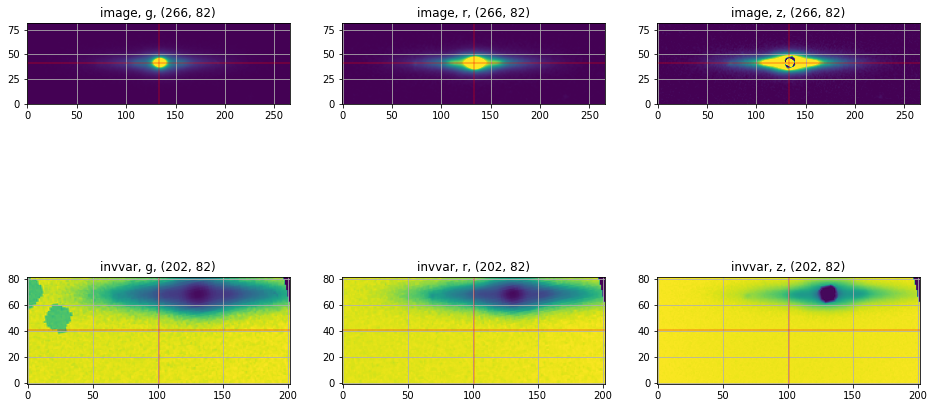

=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*
hexagons
EON_238.580_0.543


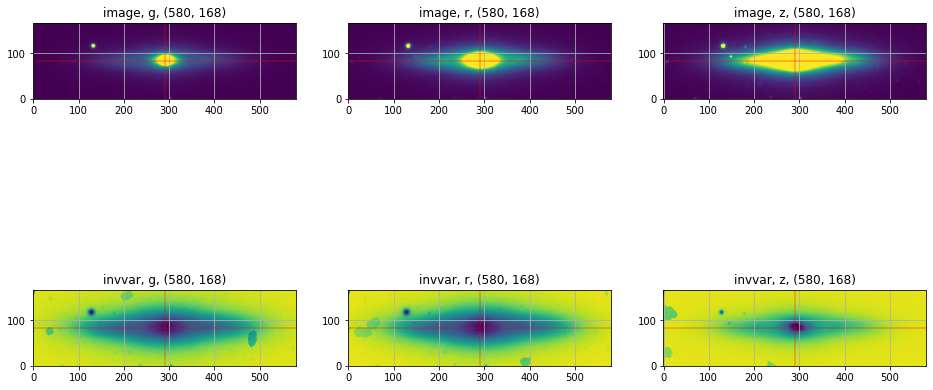

=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*
hexagons
EON_245.501_58.527


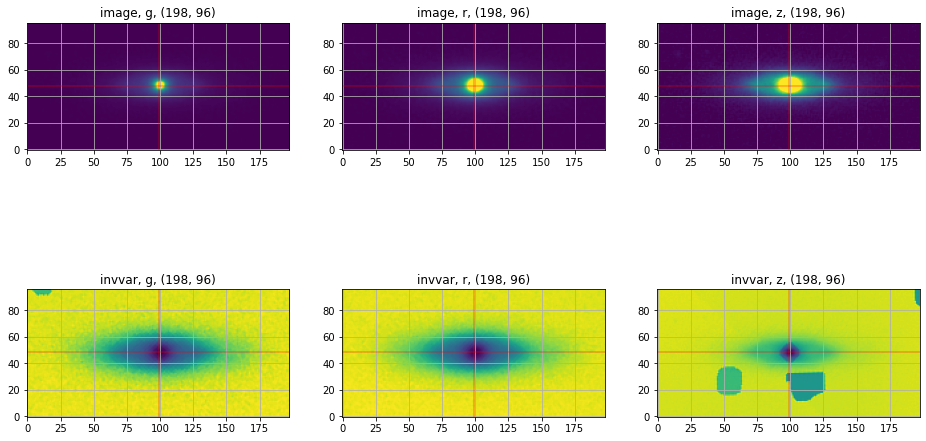

=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*
hexagons
EON_208.388_24.875


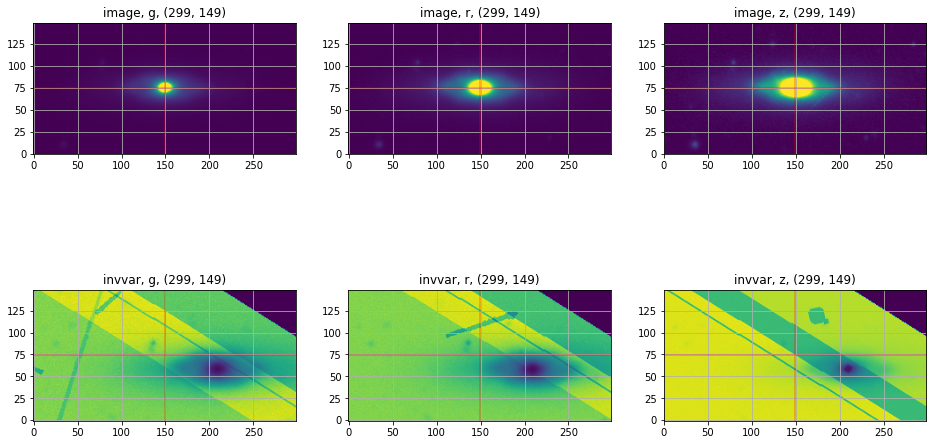

=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*
hexagons
1793_23_1_line6652


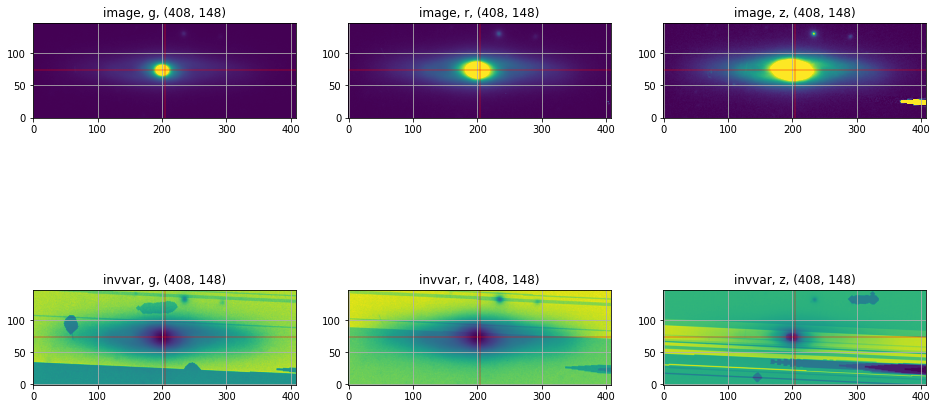

=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*
hexagons
1065_21_0_line3222


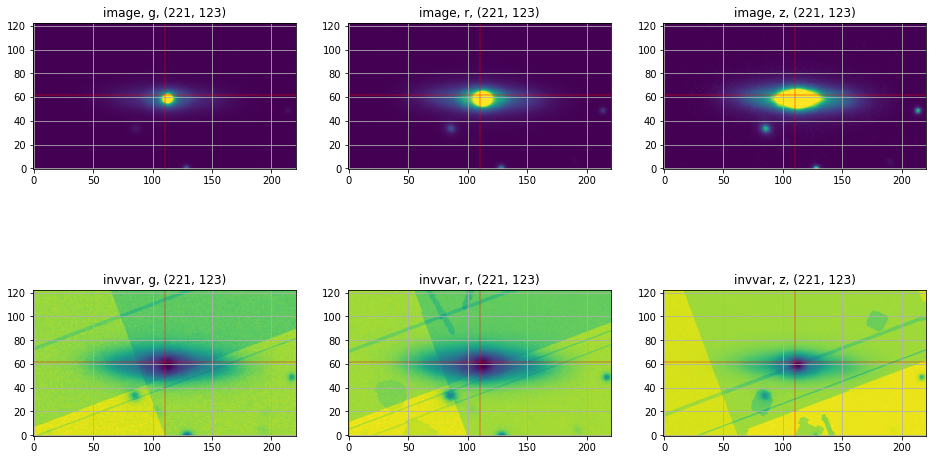

In [265]:
file_proc_gal = 'hexagons.csv'
df_proc_gal = pd.read_csv('../data/{}'.format(file_proc_gal), header=None)
name_fold = file_proc_gal.replace('.csv',"")
size=600
angles = []; sizes = []; xlencrops = []; ylencrops = []; xcentroids = []; ycentroids = []
i = 0
for name_gal in df_proc_gal[0]:  
    ind_gal = getind_gal(name_gal,df_all_gal)
    load_legacy_invvarmap(name_fold=name_fold,name=name_gal,ra=df_all_gal[1][ind_gal],
                    dec=df_all_gal[2][ind_gal])
    tab_params = getparams_ell(name_fold,name_gal,segdeb_npix=200,segdeb_nlev=32,segdeb_contr=0.001)
    newsize,xlencrop,ylencrop,xcentroid,ycentroid = getnew_cropsize(tab_params,sizefac=2.0,xfac=1.25,yfac=2.0)
    angles.append(tab_params['orientation'].value)
    sizes.append(newsize)
    xlencrops.append(xlencrop)
    ylencrops.append(ylencrop)
    xcentroids.append(xcentroid)
    ycentroids.append(ycentroid)
    rotate_crop_image(name_fold,name_gal,angles[i],size,xlencrops[i],ylencrops[i],xcentroids[i],ycentroids[i])
    draw_images_invvarmap_rotcrop(name_fold,name_gal)
    i += 1